In [ ]:
import numpy as np 
import pandas as pd 
import geopandas as gpd
import xarray as xr
import matplotlib.pyplot as plt
import pickle
from pathlib import Path
import altair as alt

### Load Data:

In [ ]:
atl06sr_gdf = pickle.load(open('../../data/icesat2/sierras_gdf_2018_2021_sa_processed_masked.pkl', 'rb'))

In [ ]:
sierras = gpd.read_file('../../data/misc/sierras_polygon_gmba.geojson')

In [ ]:
# use open_mfdataset to open all years of swe/sca data at once, then open all sd data at once, and merge the two datasets saving the output file

base_dir = '../../swe_reanalysis_pca/data/download'

swe_sca_files = []
sd_files = []

for year in range(1985, 2022):
    year_folder = Path(base_dir) / str(year)
    swe_sca_files.append(f"{base_dir}/{year}/SWE_SCA_POST_{year}.nc")
    sd_files.append(f"{base_dir}/{year}/SD_POST_{year}.nc")

def preprocess_swe(ds):
    ds = ds.rename({'Latitude': 'y', 'Longitude': 'x'})
    ds = ds.rio.set_spatial_dims('y', 'x', inplace=True)
    return ds

swe_sca_ds_allyrs = xr.open_mfdataset(
    swe_sca_files,
    combine='by_coords',
    preprocess=preprocess_swe
    # chunks={'Latitude': 1575, 'Longitude': 1125, 'time': 366},
    # parallel=True
)


sd_ds_allyrs = xr.open_mfdataset(
    sd_files,
    combine='by_coords'
    # chunks={'Latitude': 1575, 'Longitude': 1125, 'time': 366},
    # parallel=True
)

swe_sca_ds_allyrs['SD_Post'] = sd_ds_allyrs['SD_Post']


# swe_sca_ds = swe_sca_ds.rename({'Latitude': 'y', 'Longitude': 'x'})
# swe_sca_ds = swe_sca_ds.rio.set_spatial_dims('y', 'x', inplace=True)
swe_sca_ds_allyrs['SWE_Post'] = swe_sca_ds_allyrs['SWE_Post'].T
swe_sca_ds_allyrs['SCA_Post'] = swe_sca_ds_allyrs['SCA_Post'].T
swe_sca_ds_allyrs = swe_sca_ds_allyrs.transpose('time', 'y', 'x')
swe_sca_ds_allyrs.rio.write_crs('EPSG:4326', inplace=True)
#swe_sca_ds['SD_Post'] = swe_sca_ds['SD_Post'].T

<xarray.Dataset> Size: 287GB
Dimensions:      (time: 13514, y: 1575, x: 1125)
Coordinates:
  * y            (y) float32 6kB 34.0 34.01 34.01 34.02 ... 40.99 40.99 41.0
  * x            (x) float32 4kB -122.0 -122.0 -122.0 ... -117.0 -117.0 -117.0
  * time         (time) datetime64[ns] 108kB 1984-10-01 ... 2021-09-30
    spatial_ref  int64 8B 0
Data variables:
    SWE_Post     (time, y, x) float32 96GB dask.array<chunksize=(61, 263, 188), meta=np.ndarray>
    SCA_Post     (time, y, x) float32 96GB dask.array<chunksize=(61, 263, 188), meta=np.ndarray>
    SD_Post      (time, y, x) float32 96GB dask.array<chunksize=(61, 263, 188), meta=np.ndarray>

In [ ]:
swe_sca_ds_allyrs_sierras = swe_sca_ds_allyrs.rio.clip(sierras.geometry)

In [ ]:
swe_sca_ds_allyrs_sierras = swe_sca_ds_allyrs_sierras.rename({'y': 'lat', 'x': 'lon'})

In [ ]:
# 1. Select April 1 of each year
swe_sca_ds_allyrs_april1 = swe_sca_ds_allyrs_sierras.sel(time=( (swe_sca_ds_allyrs_sierras['time'].dt.month == 4) & (swe_sca_ds_allyrs_sierras['time'].dt.day == 1) ))

In [ ]:
# 2. Compute mean April 1 snow depth across years
swe_sca_ds_allyrs_april1 = swe_sca_ds_allyrs_april1.mean(dim='time', skipna=True)

In [ ]:
# 3. Threshold mask
mask = swe_sca_ds_allyrs_april1.SCA_Post > 0.5

### Get timeseries of median/average reanalysis snow depth for all years:

In [ ]:
# 4. Apply mask
swe_sca_ds_allyrs_roi = swe_sca_ds_allyrs_sierras.where(mask)

In [ ]:
# 5. Compute spatial median
median_sd_allyrs = swe_sca_ds_allyrs_roi.SD_Post.median(dim=('lat', 'lon'), skipna=True).compute()

In [ ]:
# 5. Compute spatial median
median_swe_allyrs = swe_sca_ds_allyrs_roi.SWE_Post.median(dim=('lat', 'lon'), skipna=True).compute()

## Sample the historical Reanalysis data  
### within a 2-week window of the icesat2 date. Save raw sampled values, daily medians, and 2-week mean values.

In [ ]:
# Step 1: Setup - Get ICESat-2 dates within snow season and prepare for spatial sampling
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Get ICESat-2 dates that are in the snow season
is2_snow_season_dates = medians_both[medians_both['in_snow_season'] == True]['date'].unique()
print(f"Number of ICESat-2 dates in snow season: {len(is2_snow_season_dates)}")

# Define paths
daily_sd_dir = Path('../../data/reanalysis/daily_SD_files')

# Function to convert a date to water year day (1 = Oct 1, 365/366 = Sep 30)
def date_to_wy_day(date):
    """Convert a date to water year day (1 = Oct 1)"""
    if date.month >= 10:
        wy_start = pd.Timestamp(year=date.year, month=10, day=1)
    else:
        wy_start = pd.Timestamp(year=date.year - 1, month=10, day=1)
    return (date - wy_start).days + 1

def get_water_year(date):
    """Get the water year for a date"""
    return date.year + 1 if date.month >= 10 else date.year

def wy_day_to_calendar_day(wy_day, water_year):
    """
    Convert water year day to calendar day-of-year.
    
    The daily files are named by calendar day (1-365), but organized in water year folders.
    For a given wy_day in a water_year folder:
    - wy_day 1-92 (Oct 1 - Dec 31) → calendar day 274-365 of year (water_year - 1)
    - wy_day 93-366 (Jan 1 - Sep 30) → calendar day 1-273 of year (water_year)
    
    Args:
        wy_day: Water year day (1 = Oct 1, 366 = Sep 30)
        water_year: The water year (e.g., 2021 means Oct 2020 - Sep 2021)
    
    Returns:
        calendar_day: Day of calendar year (1-365/366)
    """
    # Check if this is Oct-Dec (wy_day 1-92) or Jan-Sep (wy_day 93+)
    # Oct 1 = wy_day 1 = calendar day 274 (in non-leap year) or 275 (in leap year of previous calendar year)
    prev_year = water_year - 1
    
    # Number of days from Oct 1 to Dec 31 in the previous calendar year
    oct1_prev = pd.Timestamp(year=prev_year, month=10, day=1)
    dec31_prev = pd.Timestamp(year=prev_year, month=12, day=31)
    days_oct_to_dec = (dec31_prev - oct1_prev).days + 1  # Usually 92, could be 92
    
    if wy_day <= days_oct_to_dec:
        # This is Oct-Dec of the previous calendar year
        date = oct1_prev + pd.Timedelta(days=wy_day - 1)
        return date.dayofyear
    else:
        # This is Jan-Sep of the water year's calendar year
        jan1_wy = pd.Timestamp(year=water_year, month=1, day=1)
        date = jan1_wy + pd.Timedelta(days=(wy_day - days_oct_to_dec - 1))
        return date.dayofyear

# Test the file structure
sample_file = daily_sd_dir / '1985' / 'day_001.nc'
sample_ds = xr.open_dataset(sample_file)
print(f"Sample file dims: {sample_ds.dims}")
print(f"Sample file coords: {list(sample_ds.coords)}")
print(f"Sample file vars: {list(sample_ds.data_vars)}")
sample_ds.close()

# Verify the conversion function
print("\nVerifying wy_day_to_calendar_day conversion:")
print(f"  March 17 in WY 2021: wy_day=168 -> calendar_day={wy_day_to_calendar_day(168, 2021)} (should be 76)")
print(f"  Oct 1 in WY 2021: wy_day=1 -> calendar_day={wy_day_to_calendar_day(1, 2021)} (should be 274 or 275)")
print(f"  Jan 1 in WY 2021: wy_day=93 -> calendar_day={wy_day_to_calendar_day(93, 2021)} (should be 1)")

Number of ICESat-2 dates in snow season: 100
Sample file dims: FrozenMappingWarningOnValuesAccess({'y': 1267, 'x': 919})
Sample file coords: ['y', 'x', 'time', 'spatial_ref']
Sample file vars: ['SD_Post']

Verifying wy_day_to_calendar_day conversion:
  March 17 in WY 2021: wy_day=168 -> calendar_day=76 (should be 76)
  Oct 1 in WY 2021: wy_day=1 -> calendar_day=275 (should be 274 or 275)
  Jan 1 in WY 2021: wy_day=93 -> calendar_day=1 (should be 1)


In [ ]:
sample_ds = xr.open_dataset(sample_file)

In [ ]:
sample_ds

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 1267, x: 919)
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    time         datetime64[ns] 8B ...
    spatial_ref  int64 8B ...
Data variables:
    SD_Post      (y, x) float32 5MB ...

In [ ]:
atl06sr_gdf_snowy['acqdate_dt'].unique()

<DatetimeArray>
['2018-10-14 00:00:00', '2018-10-15 00:00:00', '2018-10-18 00:00:00',
 '2018-10-19 00:00:00', '2018-10-23 00:00:00', '2018-11-04 00:00:00',
 '2018-11-08 00:00:00', '2018-11-09 00:00:00', '2018-11-12 00:00:00',
 '2018-11-13 00:00:00',
 ...
 '2021-08-16 00:00:00', '2021-08-28 00:00:00', '2021-09-01 00:00:00',
 '2021-09-02 00:00:00', '2021-09-05 00:00:00', '2021-09-06 00:00:00',
 '2021-09-13 00:00:00', '2021-09-14 00:00:00', '2021-09-26 00:00:00',
 '2021-09-30 00:00:00']
Length: 281, dtype: datetime64[ns]

In [ ]:
is2_snow_season_dates

<DatetimeArray>
['2018-12-03 00:00:00', '2018-12-07 00:00:00', '2018-12-11 00:00:00',
 '2018-12-12 00:00:00', '2018-12-15 00:00:00', '2018-12-16 00:00:00',
 '2018-12-19 00:00:00', '2019-01-05 00:00:00', '2019-01-09 00:00:00',
 '2019-01-10 00:00:00', '2019-01-13 00:00:00', '2019-01-14 00:00:00',
 '2019-01-22 00:00:00', '2019-02-07 00:00:00', '2019-02-08 00:00:00',
 '2019-02-11 00:00:00', '2019-02-12 00:00:00', '2019-02-19 00:00:00',
 '2019-03-04 00:00:00', '2019-03-08 00:00:00', '2019-03-09 00:00:00',
 '2019-03-12 00:00:00', '2019-03-16 00:00:00', '2019-03-17 00:00:00',
 '2019-03-21 00:00:00', '2019-04-06 00:00:00', '2019-04-10 00:00:00',
 '2019-04-11 00:00:00', '2019-04-14 00:00:00', '2019-04-15 00:00:00',
 '2019-04-18 00:00:00', '2019-04-19 00:00:00', '2019-04-22 00:00:00',
 '2019-04-23 00:00:00', '2019-05-05 00:00:00', '2019-05-09 00:00:00',
 '2019-05-13 00:00:00', '2019-05-14 00:00:00', '2019-05-18 00:00:00',
 '2019-05-22 00:00:00', '2019-06-03 00:00:00', '2019-12-01 00:00:00',
 '20

In [ ]:
# Step 2: For each ICESat-2 date, sample reanalysis SD at ICESat-2 point locations
# within a 2-week window centered on the date, for all historical water years

# Get unique ICESat-2 dates and their coordinates
# Group atl06sr_gdf_snowy by date to get coordinates for each date
is2_coords_by_date = {}
for is2_date in is2_snow_season_dates:
    date_data = atl06sr_gdf_snowy[atl06sr_gdf_snowy['acqdate_dt'] == is2_date]
    if len(date_data) > 0:
        # Get x, y coordinates from geometry
        xs = date_data.geometry.x.values
        ys = date_data.geometry.y.values
        is2_coords_by_date[is2_date] = {'x': xs, 'y': ys}

print(f"Number of dates with coordinates: {len(is2_coords_by_date)}")

# Define water years to sample from (1985-2021)
all_water_years = list(range(1985, 2022))

# Dictionary to store results: {is2_date: DataFrame with columns [water_year, mean_sd]}
is2_date_analog_sd = {}

Number of dates with coordinates: 100


In [ ]:
# Step 3: Main sampling loop (FIXED: use calendar day-of-year for file names)
# For each ICESat-2 date, sample SD at those locations from all historical years
# With intermediate data saving

from tqdm import tqdm
import pickle
from pathlib import Path

HALF_WINDOW = 7  # 7 days before and after = 14-15 day window centered on date

# Output directory for intermediate saves
intermediate_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/temp/analog_intermediate')
intermediate_dir.mkdir(parents=True, exist_ok=True)

def sample_sd_at_locations_vectorized(sd_ds, xs, ys):
    """Sample snow depth at given x,y coordinates using vectorized nearest neighbor selection"""
    try:
        # Create DataArrays for coordinates to enable vectorized selection
        x_da = xr.DataArray(xs, dims=['points'])
        y_da = xr.DataArray(ys, dims=['points'])
        
        # Vectorized selection using method='nearest' with DataArrays
        sd_values = sd_ds['SD_Post'].sel(x=x_da, y=y_da, method='nearest').values
        
        # Filter out NaN values
        valid_values = sd_values[~np.isnan(sd_values)]
        return valid_values
    except Exception as e:
        return np.array([])

# Data structures for intermediate storage
# raw_sampled_values: {is2_date: {wy: {calendar_day: array of SD values}}}
raw_sampled_values = {}
# daily_medians_by_date: {is2_date: {wy: list of daily medians}}
daily_medians_by_date = {}
# is2_date_analog_sd remains for final mean of medians

# Process each ICESat-2 date
processed_count = 0
for is2_date in tqdm(is2_snow_season_dates, desc="Processing ICESat-2 dates"):
    if is2_date not in is2_coords_by_date:
        continue
    
    coords = is2_coords_by_date[is2_date]
    xs, ys = coords['x'], coords['y']
    
    # Get the water year day for this ICESat-2 date
    is2_wy_day = date_to_wy_day(is2_date)
    is2_wy = get_water_year(is2_date)
    
    # Define the window of water year days to sample
    wy_days_to_sample = list(range(is2_wy_day - HALF_WINDOW, is2_wy_day + HALF_WINDOW + 1))
    # Handle edge cases (keep within 1-366)
    wy_days_to_sample = [d for d in wy_days_to_sample if 1 <= d <= 366]
    
    # Initialize intermediate storage for this date
    raw_sampled_values[is2_date] = {}
    daily_medians_by_date[is2_date] = {}
    
    # Store results for this ICESat-2 date (final mean of medians)
    wy_results = []
    
    # Sample from each historical water year (excluding the ICESat-2's own year)
    for wy in all_water_years:
        if wy == is2_wy:
            continue  # Skip the ICESat-2's own water year
        
        raw_sampled_values[is2_date][wy] = {}
        
        # Collect median SD values for each day in the 2-week window
        daily_medians = []
        
        for wy_day in wy_days_to_sample:
            # FIXED: Convert water year day to calendar day-of-year for file lookup
            calendar_day = wy_day_to_calendar_day(wy_day, wy)
            
            # Construct file path using calendar day (not wy_day!)
            sd_file = daily_sd_dir / str(wy) / f'day_{calendar_day:03d}.nc'
            
            if not sd_file.exists():
                continue
            
            try:
                sd_ds = xr.open_dataset(sd_file)
                # Sample at ICESat-2 locations using vectorized selection
                sd_values = sample_sd_at_locations_vectorized(sd_ds, xs, ys)
                sd_ds.close()
                
                # Store raw sampled values (keyed by calendar_day for clarity)
                raw_sampled_values[is2_date][wy][calendar_day] = sd_values.copy()
                
                if len(sd_values) > 0:
                    # Calculate median for this day
                    daily_medians.append(np.median(sd_values))
            except:
                continue
        
        # Store daily medians for this water year
        daily_medians_by_date[is2_date][wy] = daily_medians.copy()
        
        # Calculate the average of the 2-week block of daily medians
        if len(daily_medians) > 0:
            mean_of_medians = np.mean(daily_medians)
            wy_results.append({'water_year': wy, 'mean_sd': mean_of_medians})
    
    # Create DataFrame for this ICESat-2 date
    if len(wy_results) > 0:
        is2_date_analog_sd[is2_date] = pd.DataFrame(wy_results)
    
    processed_count += 1
    
    # Periodic save every 10 dates
    if processed_count % 10 == 0:
        print(f"\nSaving intermediate data after {processed_count} dates...")
        with open(intermediate_dir / 'raw_sampled_values_checkpoint.pkl', 'wb') as f:
            pickle.dump(raw_sampled_values, f)
        with open(intermediate_dir / 'daily_medians_checkpoint.pkl', 'wb') as f:
            pickle.dump(daily_medians_by_date, f)
        with open(intermediate_dir / 'is2_date_analog_sd_checkpoint.pkl', 'wb') as f:
            pickle.dump(is2_date_analog_sd, f)

# Final save after all processing
print(f"\nSaving final intermediate data...")
with open(intermediate_dir / 'raw_sampled_values_final.pkl', 'wb') as f:
    pickle.dump(raw_sampled_values, f)
with open(intermediate_dir / 'daily_medians_final.pkl', 'wb') as f:
    pickle.dump(daily_medians_by_date, f)
with open(intermediate_dir / 'is2_date_analog_sd_final.pkl', 'wb') as f:
    pickle.dump(is2_date_analog_sd, f)

print(f"\nProcessed {len(is2_date_analog_sd)} ICESat-2 dates with analog data")
print(f"Intermediate data saved to: {intermediate_dir}")

Processing ICESat-2 dates:   9%|▉         | 9/100 [02:32<17:22, 11.46s/it]


Saving intermediate data after 10 dates...


Processing ICESat-2 dates:  19%|█▉        | 19/100 [06:37<26:56, 19.95s/it]


Saving intermediate data after 20 dates...


Processing ICESat-2 dates:  29%|██▉       | 29/100 [11:15<40:56, 34.60s/it]


Saving intermediate data after 30 dates...


Processing ICESat-2 dates:  39%|███▉      | 39/100 [15:35<50:04, 49.25s/it]


Saving intermediate data after 40 dates...


Processing ICESat-2 dates:  49%|████▉     | 49/100 [23:37<44:21, 52.19s/it]  


Saving intermediate data after 50 dates...


Processing ICESat-2 dates:  59%|█████▉    | 59/100 [27:49<27:39, 40.47s/it]


Saving intermediate data after 60 dates...


Processing ICESat-2 dates:  69%|██████▉   | 69/100 [31:49<10:57, 21.21s/it]


Saving intermediate data after 70 dates...


Processing ICESat-2 dates:  79%|███████▉  | 79/100 [36:11<12:57, 37.03s/it]


Saving intermediate data after 80 dates...


Processing ICESat-2 dates:  89%|████████▉ | 89/100 [39:44<04:10, 22.73s/it]


Saving intermediate data after 90 dates...


Processing ICESat-2 dates:  99%|█████████▉| 99/100 [45:45<00:39, 39.18s/it]


Saving intermediate data after 100 dates...


Processing ICESat-2 dates: 100%|██████████| 100/100 [48:01<00:00, 28.81s/it]



Saving final intermediate data...

Processed 100 ICESat-2 dates with analog data
Intermediate data saved to: /Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/temp/analog_intermediate


In [ ]:
# If the above cell crashes, reload checkpoint files with the below code:

# with open(intermediate_dir / 'raw_sampled_values_checkpoint.pkl', 'rb') as f:
#     raw_sampled_values = pickle.load(f)

In [ ]:
is2_date_analog_sd

{Timestamp('2018-12-03 00:00:00'):     water_year   mean_sd
 0         1985  1.181467
 1         1986  1.388307
 2         1987  0.126927
 3         1988  0.422733
 4         1989  1.060147
 5         1990  0.490053
 6         1991  0.425733
 7         1992  0.853613
 8         1993  2.132827
 9         1994  0.861393
 10        1995  1.378200
 11        1996  1.467973
 12        1997  1.138627
 13        1998  2.013026
 14        1999  0.348007
 15        2000  1.372107
 16        2001  1.256320
 17        2002  0.204173
 18        2003  0.682787
 19        2004  1.410987
 20        2005  1.870840
 21        2006  0.819347
 22        2007  0.348093
 23        2008  1.637227
 24        2009  1.018973
 25        2010  1.580440
 26        2011  1.260760
 27        2012  0.202907
 28        2013  0.330660
 29        2014  0.300760
 30        2015  0.001653
 31        2016  0.669480
 32        2017  2.021573
 33        2018  0.187813
 34        2020  0.173307
 35        2021  0.155440,
 Ti

In [ ]:
# Step 4: Construct reconstructed time series for each water year with ICESat-2 data
# For WY 2019, 2020, 2021: take all ICESat-2 dates from that year and combine 
# the historical year values to create reconstructed time series

# Separate ICESat-2 dates by their water year
is2_dates_by_wy = {2019: [], 2020: [], 2021: []}
for is2_date in is2_date_analog_sd.keys():
    wy = get_water_year(is2_date)
    if wy in is2_dates_by_wy:
        is2_dates_by_wy[wy].append(is2_date)

for wy in is2_dates_by_wy:
    is2_dates_by_wy[wy] = sorted(is2_dates_by_wy[wy])
    print(f"WY {wy}: {len(is2_dates_by_wy[wy])} ICESat-2 dates")

# Create reconstructed time series for each IS2 water year
# Structure: {is2_wy: {historical_wy: DataFrame with columns [is2_date, wy_day, mean_sd]}}
reconstructed_timeseries = {}

for is2_wy in [2019, 2020, 2021]:
    reconstructed_timeseries[is2_wy] = {}
    
    # Get all historical water years (excluding the current one)
    historical_wys = [wy for wy in all_water_years if wy != is2_wy]
    
    for hist_wy in historical_wys:
        records = []
        
        for is2_date in is2_dates_by_wy[is2_wy]:
            if is2_date not in is2_date_analog_sd:
                continue
            
            df = is2_date_analog_sd[is2_date]
            # Get the value for this historical water year
            hist_row = df[df['water_year'] == hist_wy]
            
            if len(hist_row) > 0:
                records.append({
                    'is2_date': is2_date,
                    'wy_day': date_to_wy_day(is2_date),
                    'mean_sd': hist_row['mean_sd'].values[0]
                })
        
        if len(records) > 0:
            reconstructed_timeseries[is2_wy][hist_wy] = pd.DataFrame(records).sort_values('wy_day')

print("\nReconstructed time series created:")
for is2_wy in reconstructed_timeseries:
    print(f"  WY {is2_wy}: {len(reconstructed_timeseries[is2_wy])} historical years with data")

WY 2019: 41 ICESat-2 dates
WY 2020: 33 ICESat-2 dates
WY 2021: 26 ICESat-2 dates

Reconstructed time series created:
  WY 2019: 36 historical years with data
  WY 2020: 36 historical years with data
  WY 2021: 36 historical years with data


In [ ]:
# Step 5: Calculate cumulative increases and decreases for each reconstructed time series

def calculate_cumulative_changes(df):
    """Calculate cumulative increases and decreases for a time series"""
    df = df.sort_values('wy_day').copy()
    
    # Calculate daily changes
    df['daily_change'] = df['mean_sd'].diff()
    
    # Separate increases and decreases
    df['increase'] = df['daily_change'].clip(lower=0)
    df['decrease'] = df['daily_change'].clip(upper=0)
    
    # Calculate cumulative sums
    df['cumulative_increase'] = df['increase'].cumsum().fillna(0)
    df['cumulative_decrease'] = df['decrease'].cumsum().fillna(0)
    
    return df

# Apply to all reconstructed time series
for is2_wy in reconstructed_timeseries:
    for hist_wy in reconstructed_timeseries[is2_wy]:
        df = reconstructed_timeseries[is2_wy][hist_wy]
        reconstructed_timeseries[is2_wy][hist_wy] = calculate_cumulative_changes(df)

# Show example
print("Example reconstructed time series with cumulative changes (WY 2019, historical WY 1985):")
if 1985 in reconstructed_timeseries[2019]:
    print(reconstructed_timeseries[2019][1985].head(10))

Example reconstructed time series with cumulative changes (WY 2019, historical WY 1985):
    is2_date  wy_day   mean_sd  daily_change  increase  decrease  \
0 2018-12-03      64  0.839647           NaN       NaN       NaN   
1 2018-12-07      68  0.906520      0.066873  0.066873  0.000000   
2 2018-12-11      72  0.954000      0.047480  0.047480  0.000000   
3 2018-12-12      73  1.008800      0.054800  0.054800  0.000000   
4 2018-12-15      76  0.136920     -0.871880  0.000000 -0.871880   
5 2018-12-16      77  0.709587      0.572667  0.572667  0.000000   
6 2018-12-19      80  0.799787      0.090200  0.090200  0.000000   
7 2019-01-05      97  1.176253      0.376467  0.376467  0.000000   
8 2019-01-09     101  0.686400     -0.489853  0.000000 -0.489853   
9 2019-01-10     102  1.255213      0.568813  0.568813  0.000000   

   cumulative_increase  cumulative_decrease  
0             0.000000             0.000000  
1             0.066873             0.000000  
2             0.114353  

In [ ]:
# Step 6: For each ICESat-2 date between March 1 and May 31, find top 5 analog years
# for cumulative increases and decreases independently

# Define March 1 - May 31 in terms of water year days
# March 1 = day 152 of water year (Oct 1 = day 1, so March 1 is about 5 months in)
# Actually: Oct=31, Nov=30, Dec=31, Jan=31, Feb=28 = 151 days, so March 1 = day 152
# May 31: March=31+152=183, April=30+183=213, May 31=213+31=244, so May 31 = day 244
MARCH_1_WY_DAY = 152  # approximate
MAY_31_WY_DAY = 244   # approximate

# Filter to March 1 - May 31 dates
def is_in_spring_window(date):
    """Check if date is between March 1 and May 31"""
    return (date.month >= 3 and date.month <= 5)

# Store best analogs for each IS2 date in spring window
# Structure: {is2_date: {'best_increase': [(wy, diff), ...], 'best_decrease': [(wy, diff), ...]}}
spring_analog_results = {}

for is2_wy in [2019, 2020, 2021]:
    for is2_date in is2_dates_by_wy[is2_wy]:
        # Check if date is in March-May window
        if not is_in_spring_window(is2_date):
            continue
        
        wy_day = date_to_wy_day(is2_date)
        
        # Collect cumulative values at this wy_day from all historical reconstructions
        increase_diffs = []
        decrease_diffs = []
        
        # Get the actual ICESat-2 cumulative values for this date
        # We need to compare against something - let's compare against each other
        # or we can just rank by absolute cumulative value
        
        for hist_wy, df in reconstructed_timeseries[is2_wy].items():
            # Find the row for this wy_day (or closest)
            row = df[df['wy_day'] == wy_day]
            
            if len(row) == 0:
                # Find closest wy_day
                closest_idx = (df['wy_day'] - wy_day).abs().idxmin()
                row = df.loc[[closest_idx]]
            
            if len(row) > 0:
                cum_inc = row['cumulative_increase'].values[0]
                cum_dec = row['cumulative_decrease'].values[0]
                increase_diffs.append((hist_wy, cum_inc))
                decrease_diffs.append((hist_wy, cum_dec))
        
        # Sort by cumulative value to find most similar
        # For increases: smaller absolute difference from some reference
        # For decreases: smaller absolute difference from some reference
        # Since we don't have a clear reference, let's rank by the actual cumulative values
        # and store all of them, then we can compare
        
        if len(increase_diffs) >= 5:
            # Sort by cumulative increase (ascending = least snow gain)
            increase_diffs_sorted = sorted(increase_diffs, key=lambda x: x[1])
            decrease_diffs_sorted = sorted(decrease_diffs, key=lambda x: x[1])  # Most negative = most melt
            
            spring_analog_results[is2_date] = {
                'is2_wy': is2_wy,
                'wy_day': wy_day,
                'all_increase': increase_diffs_sorted,
                'all_decrease': decrease_diffs_sorted
            }

print(f"ICESat-2 dates in March-May window with analog data: {len(spring_analog_results)}")

ICESat-2 dates in March-May window with analog data: 44


In [ ]:
# Step 6b: Find top 5 analogs based on smallest absolute difference to actual ICESat-2 cumulative values
# We need to compare the reconstructed cumulative values against the actual ICESat-2 cumulative values

# First, get the actual ICESat-2 cumulative increase/decrease values from medians_both
is2_cumulative = medians_both[['date', 'cumulative_increase_snow_season', 'cumulative_decrease_snow_season']].copy()
is2_cumulative = is2_cumulative.dropna()

# Update spring_analog_results with best matches based on absolute difference
best_analogs_spring_increase = {}
best_analogs_spring_decrease = {}

for is2_date, result in spring_analog_results.items():
    is2_wy = result['is2_wy']
    
    # Get actual ICESat-2 cumulative values for this date
    is2_row = is2_cumulative[is2_cumulative['date'] == is2_date]
    
    if len(is2_row) == 0:
        continue
    
    actual_cum_inc = is2_row['cumulative_increase_snow_season'].values[0]
    actual_cum_dec = is2_row['cumulative_decrease_snow_season'].values[0]
    
    # Calculate absolute differences for increases
    inc_with_diff = [(wy, val, abs(val - actual_cum_inc)) for wy, val in result['all_increase']]
    inc_sorted = sorted(inc_with_diff, key=lambda x: x[2])[:5]  # Top 5 smallest differences
    
    # Calculate absolute differences for decreases
    dec_with_diff = [(wy, val, abs(val - actual_cum_dec)) for wy, val in result['all_decrease']]
    dec_sorted = sorted(dec_with_diff, key=lambda x: x[2])[:5]  # Top 5 smallest differences
    
    best_analogs_spring_increase[is2_date] = pd.DataFrame(
        inc_sorted, 
        columns=['water_year', 'cumulative_increase', 'abs_difference']
    )
    best_analogs_spring_decrease[is2_date] = pd.DataFrame(
        dec_sorted, 
        columns=['water_year', 'cumulative_decrease', 'abs_difference']
    )

print(f"Best analog years computed for {len(best_analogs_spring_increase)} spring ICESat-2 dates")

# Show example
example_date = list(best_analogs_spring_increase.keys())[0]
print(f"\nExample: Best analog years for {example_date.date()} (cumulative increase):")
print(best_analogs_spring_increase[example_date])
print(f"\nBest analog years for {example_date.date()} (cumulative decrease):")
print(best_analogs_spring_decrease[example_date])

Best analog years computed for 44 spring ICESat-2 dates

Example: Best analog years for 2019-03-04 (cumulative increase):
   water_year  cumulative_increase  abs_difference
0        1993             5.499660        0.312185
1        1998             5.418020        0.393825
2        2017             5.102013        0.709832
3        2002             4.991727        0.820118
4        2011             4.762920        1.048924

Best analog years for 2019-03-04 (cumulative decrease):
   water_year  cumulative_decrease  abs_difference
0        2002            -5.089193        0.520721
1        2011            -3.754854        0.813618
2        1998            -3.644913        0.923559
3        1995            -3.587727        0.980745
4        2006            -3.506840        1.061632


In [ ]:
# Step 7: Create summary of best analog years for each spring ICESat-2 date
# and visualize results

# Summary table
summary_records = []
for is2_date in best_analogs_spring_increase.keys():
    is2_wy = get_water_year(is2_date)
    
    inc_df = best_analogs_spring_increase[is2_date]
    dec_df = best_analogs_spring_decrease[is2_date]
    
    # Get the actual ICESat-2 values
    is2_row = is2_cumulative[is2_cumulative['date'] == is2_date]
    actual_inc = is2_row['cumulative_increase_snow_season'].values[0] if len(is2_row) > 0 else np.nan
    actual_dec = is2_row['cumulative_decrease_snow_season'].values[0] if len(is2_row) > 0 else np.nan
    
    summary_records.append({
        'is2_date': is2_date,
        'is2_wy': is2_wy,
        'wy_day': date_to_wy_day(is2_date),
        'actual_cum_increase': actual_inc,
        'actual_cum_decrease': actual_dec,
        'best_inc_wy_1': inc_df.iloc[0]['water_year'],
        'best_inc_wy_2': inc_df.iloc[1]['water_year'],
        'best_inc_wy_3': inc_df.iloc[2]['water_year'],
        'best_inc_wy_4': inc_df.iloc[3]['water_year'],
        'best_inc_wy_5': inc_df.iloc[4]['water_year'],
        'best_dec_wy_1': dec_df.iloc[0]['water_year'],
        'best_dec_wy_2': dec_df.iloc[1]['water_year'],
        'best_dec_wy_3': dec_df.iloc[2]['water_year'],
        'best_dec_wy_4': dec_df.iloc[3]['water_year'],
        'best_dec_wy_5': dec_df.iloc[4]['water_year'],
    })

summary_df = pd.DataFrame(summary_records)
summary_df = summary_df.sort_values(['is2_wy', 'is2_date'])
print(f"Summary of best analog years for {len(summary_df)} spring ICESat-2 dates:")
summary_df

Summary of best analog years for 44 spring ICESat-2 dates:


,is2_date,is2_wy,wy_day,actual_cum_increase,actual_cum_decrease,best_inc_wy_1,best_inc_wy_2,best_inc_wy_3,best_inc_wy_4,best_inc_wy_5,best_dec_wy_1,best_dec_wy_2,best_dec_wy_3,best_dec_wy_4,best_dec_wy_5
0,2019-03-04,2019,155,5.811845,-4.568472,1993.0,1998.0,2017.0,2002.0,2011.0,2002.0,2011.0,1998.0,1995.0,2006.0
1,2019-03-08,2019,159,6.723129,-4.568472,2017.0,1993.0,2002.0,1998.0,1995.0,2002.0,2011.0,1998.0,1995.0,2006.0
2,2019-03-09,2019,160,6.723129,-5.213876,2017.0,1993.0,2002.0,1998.0,1995.0,2017.0,1986.0,1993.0,2011.0,1995.0
3,2019-03-12,2019,163,7.550237,-5.213876,2017.0,1993.0,2002.0,1995.0,2011.0,2017.0,1986.0,1993.0,2011.0,1995.0
4,2019-03-16,2019,167,7.550237,-6.809305,2017.0,1993.0,2002.0,1995.0,2011.0,1993.0,1986.0,2017.0,1995.0,1998.0
5,2019-03-17,2019,168,8.894712,-6.809305,2002.0,1993.0,1995.0,2017.0,2011.0,1993.0,1986.0,2017.0,1995.0,1998.0
6,2019-03-21,2019,172,8.894712,-7.618393,2002.0,1993.0,1995.0,2017.0,2011.0,1986.0,2002.0,1993.0,2017.0,1995.0
7,2019-04-06,2019,188,9.869580,-7.618393,1986.0,2017.0,1993.0,1998.0,1995.0,1986.0,2002.0,1993.0,2017.0,1995.0
8,2019-04-10,2019,192,9.869580,-7.948619,1986.0,2017.0,1993.0,1998.0,1995.0,2002.0,1993.0,1986.0,2017.0,1995.0
9,2019-04-11,2019,193,10.392503,-7.948619,1993.0,1986.0,1998.0,2017.0,1995.0,2002.0,1993.0,1986.0,2017.0,1999.0


Example dates for visualization: [datetime.date(2019, 4, 15), datetime.date(2020, 4, 12), datetime.date(2021, 4, 7)]


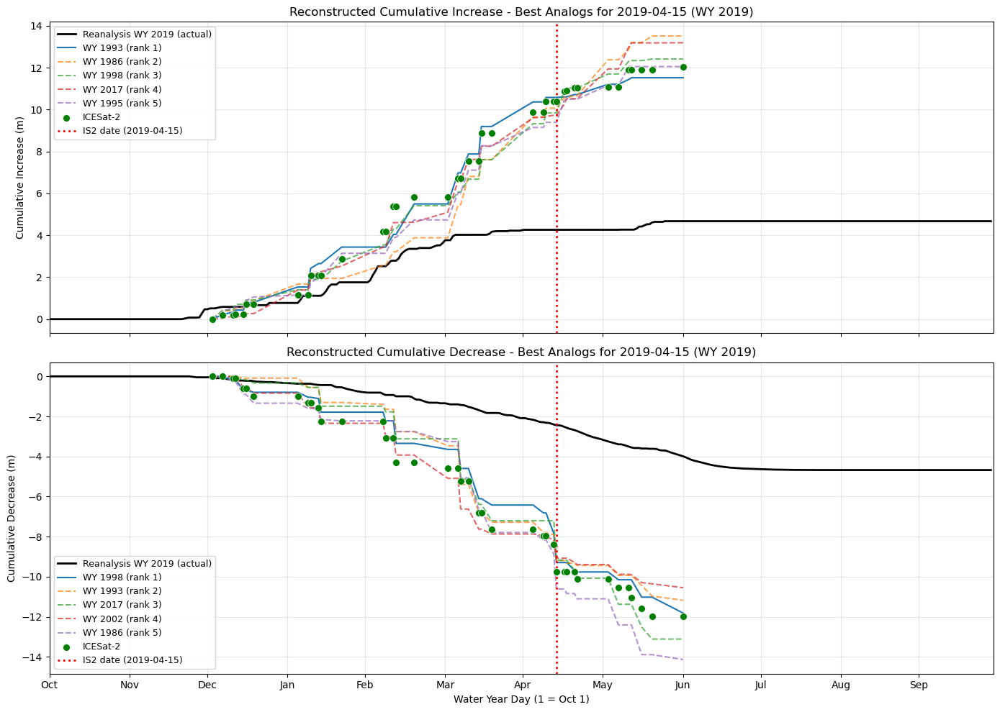

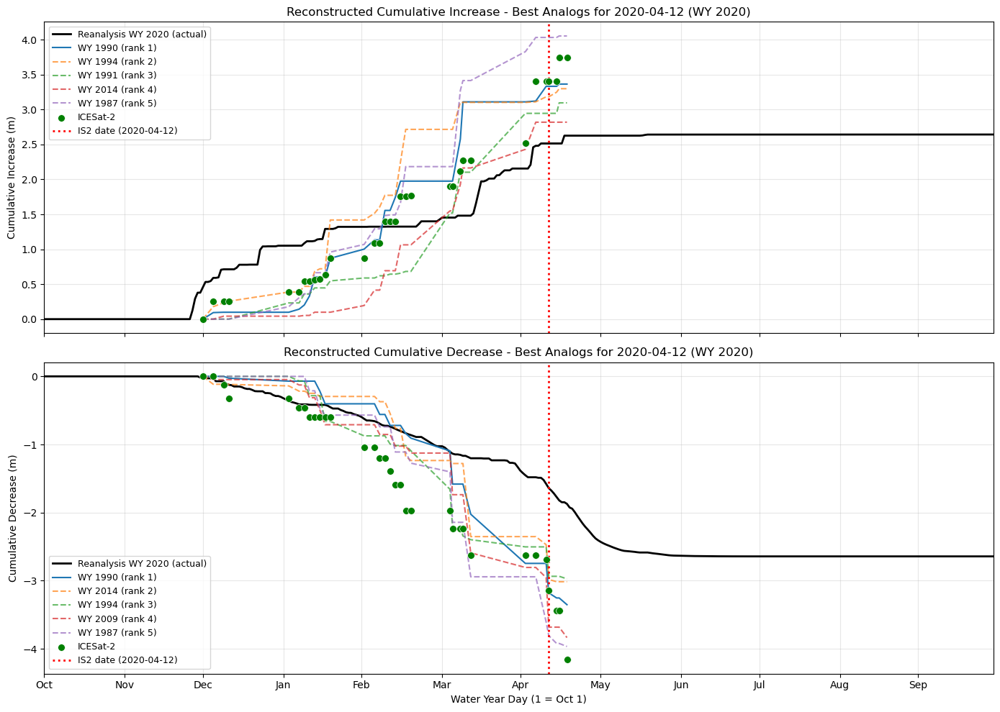

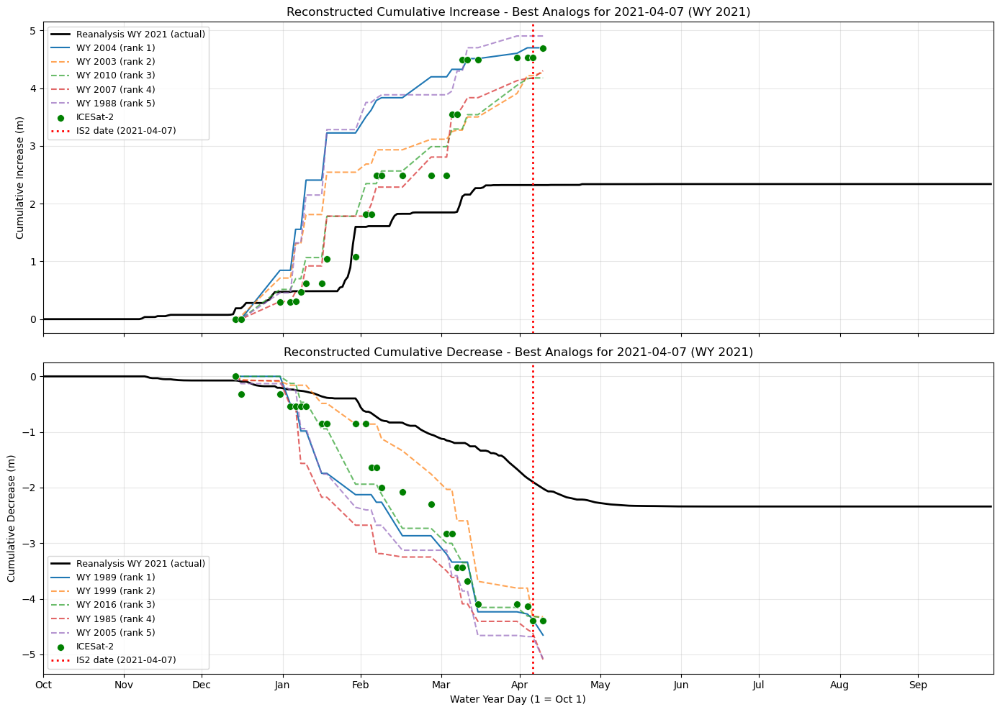

In [ ]:
# Step 8: Visualize the reconstructed time series with best analogs for select dates
# Plot for a few example dates, including ICESat-2 observations and real reanalysis from that WY

# Pick 3 example dates (one from each WY)
example_dates = []
for wy in [2019, 2020, 2021]:
    wy_dates = [d for d in best_analogs_spring_increase.keys() if get_water_year(d) == wy]
    if len(wy_dates) > 0:
        # Pick a date around mid-April
        mid_april_dates = [d for d in wy_dates if d.month == 4]
        if len(mid_april_dates) > 0:
            example_dates.append(mid_april_dates[len(mid_april_dates)//2])
        else:
            example_dates.append(wy_dates[len(wy_dates)//2])

print(f"Example dates for visualization: {[d.date() for d in example_dates]}")

# Plot each example
for is2_date in example_dates:
    is2_wy = get_water_year(is2_date)
    wy_day = date_to_wy_day(is2_date)
    
    # Get best analog years
    best_inc_wys = best_analogs_spring_increase[is2_date]['water_year'].values[:5]
    best_dec_wys = best_analogs_spring_decrease[is2_date]['water_year'].values[:5]
    
    # Get ICESat-2 data for this water year
    is2_wy_df = medians_both[medians_both['water_year'] == is2_wy].copy()
    is2_wy_df['wy_day'] = is2_wy_df['date'].apply(date_to_wy_day)
    
    # Get real reanalysis data for this water year and add wy_day
    re_wy_actual = sd_df[sd_df['water_year'] == is2_wy].copy()
    if len(re_wy_actual) > 0:
        re_wy_actual['wy_day'] = re_wy_actual['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    
    # Plot cumulative increase
    # Real reanalysis for the actual WY (black solid line)
    if len(re_wy_actual) > 0:
        axes[0].plot(re_wy_actual['wy_day'], re_wy_actual['cumulative_increase'], 
                    label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)
    
    # Reconstructed analog years (dashed lines)
    for i, hist_wy in enumerate(best_inc_wys):
        if hist_wy in reconstructed_timeseries[is2_wy]:
            df = reconstructed_timeseries[is2_wy][hist_wy]
            axes[0].plot(df['wy_day'], df['cumulative_increase'], 
                        label=f'WY {int(hist_wy)} (rank {i+1})', 
                        linestyle='--' if i > 0 else '-',
                        alpha=0.7 if i > 0 else 1.0,
                        linewidth=1.5)
    
    # ICESat-2 observations (scatter points)
    if len(is2_wy_df) > 0:
        axes[0].scatter(is2_wy_df['wy_day'], is2_wy_df['cumulative_increase_snow_season'], 
                       label='ICESat-2', color='green', s=50, zorder=5, edgecolor='white', linewidth=0.5)
    
    # Add vertical line for the ICESat-2 date
    axes[0].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
    axes[0].set_ylabel('Cumulative Increase (m)')
    axes[0].set_title(f'Reconstructed Cumulative Increase - Best Analogs for {is2_date.date()} (WY {is2_wy})')
    axes[0].legend(loc='upper left', fontsize=9)
    axes[0].grid(alpha=0.3)
    
    # Plot cumulative decrease
    # Real reanalysis for the actual WY (black solid line)
    if len(re_wy_actual) > 0:
        axes[1].plot(re_wy_actual['wy_day'], re_wy_actual['cumulative_decrease'], 
                    label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)
    
    # Reconstructed analog years (dashed lines)
    for i, hist_wy in enumerate(best_dec_wys):
        if hist_wy in reconstructed_timeseries[is2_wy]:
            df = reconstructed_timeseries[is2_wy][hist_wy]
            axes[1].plot(df['wy_day'], df['cumulative_decrease'], 
                        label=f'WY {int(hist_wy)} (rank {i+1})', 
                        linestyle='--' if i > 0 else '-',
                        alpha=0.7 if i > 0 else 1.0,
                        linewidth=1.5)
    
    # ICESat-2 observations (scatter points)
    if len(is2_wy_df) > 0:
        axes[1].scatter(is2_wy_df['wy_day'], is2_wy_df['cumulative_decrease_snow_season'], 
                       label='ICESat-2', color='green', s=50, zorder=5, edgecolor='white', linewidth=0.5)
    
    axes[1].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
    axes[1].set_ylabel('Cumulative Decrease (m)')
    axes[1].set_xlabel('Water Year Day (1 = Oct 1)')
    axes[1].set_title(f'Reconstructed Cumulative Decrease - Best Analogs for {is2_date.date()} (WY {is2_wy})')
    axes[1].legend(loc='lower left', fontsize=9)
    axes[1].grid(alpha=0.3)
    
    # Set x-axis ticks for months
    axes[1].set_xlim(1, 366)
    axes[1].set_xticks([1, 32, 62, 93, 123, 154, 184, 215, 246, 276, 307, 337])
    axes[1].set_xticklabels(['Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep'])
    
    plt.tight_layout()
    plt.show()

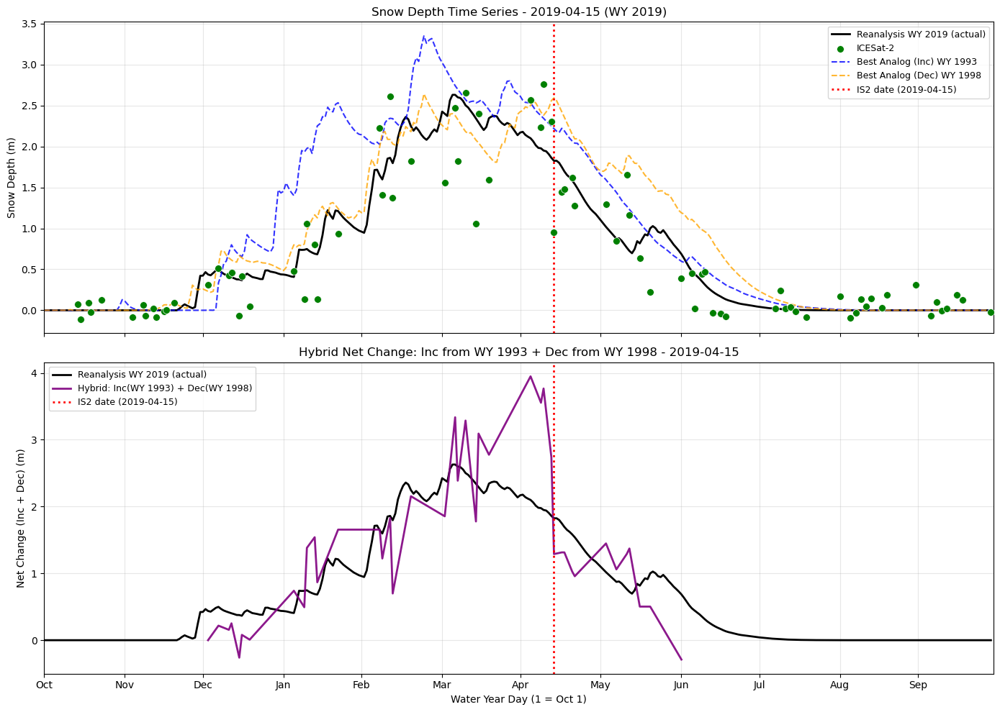


2019-04-15: Best analog by increases = WY 1993, Best analog by decreases = WY 1998


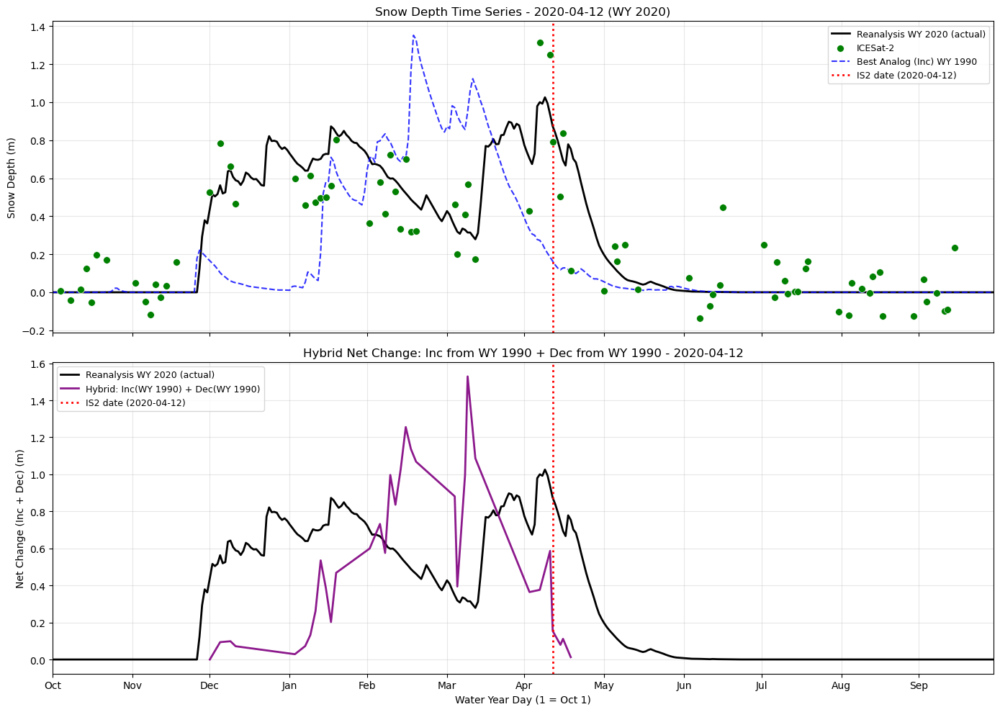


2020-04-12: Best analog by increases = WY 1990, Best analog by decreases = WY 1990


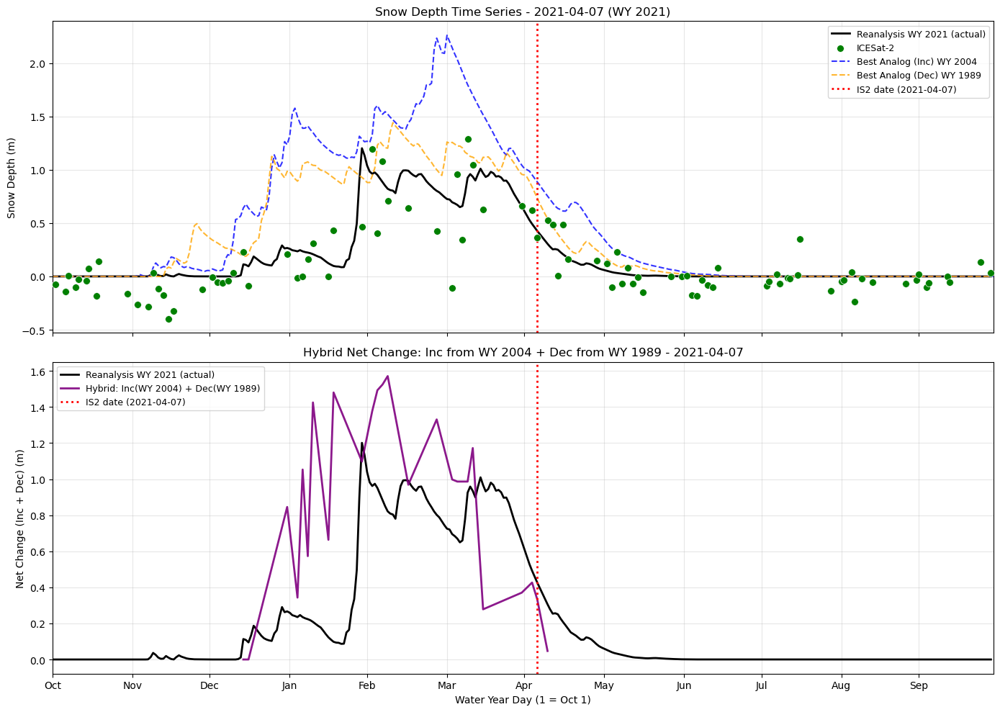


2021-04-07: Best analog by increases = WY 2004, Best analog by decreases = WY 1989


In [ ]:
# Step 8b: Plot snow depth values (not cumulative) with reconstructed analog timeseries
# Shows: ICESat-2 SD, Reanalysis SD, Best analog WY by increases, Best analog WY by decreases,
# and hybrid net change (inc from best inc year + dec from best dec year)

for is2_date in example_dates:
    is2_wy = get_water_year(is2_date)
    wy_day = date_to_wy_day(is2_date)
    
    # Get best analog years (rank 1 only)
    best_inc_wy = best_analogs_spring_increase[is2_date]['water_year'].values[0]
    best_dec_wy = best_analogs_spring_decrease[is2_date]['water_year'].values[0]
    
    # Get ICESat-2 data for this water year (actual snow depth values)
    is2_wy_df = medians_both[medians_both['water_year'] == is2_wy].copy()
    is2_wy_df['wy_day'] = is2_wy_df['date'].apply(date_to_wy_day)
    
    # Get real reanalysis data for this water year (actual snow depth values)
    re_wy_actual = sd_df[sd_df['water_year'] == is2_wy].copy()
    if len(re_wy_actual) > 0:
        re_wy_actual['wy_day'] = re_wy_actual['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))
    
    # Get reconstructed analog timeseries for best increase and decrease years
    best_inc_ts = reconstructed_timeseries[is2_wy].get(best_inc_wy, None)
    best_dec_ts = reconstructed_timeseries[is2_wy].get(best_dec_wy, None)
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    
    # ----- Top panel: Snow Depth Values -----
    # Real reanalysis SD for the actual WY (black line)
    if len(re_wy_actual) > 0:
        axes[0].plot(re_wy_actual['wy_day'], re_wy_actual['median_sd'], 
                    label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)
    
    # ICESat-2 observations (scatter points) - using 'icesat2_3dep_dif' as snow depth
    if len(is2_wy_df) > 0:
        axes[0].scatter(is2_wy_df['wy_day'], is2_wy_df['icesat2_3dep_dif'], 
                       label='ICESat-2', color='green', s=50, zorder=5, edgecolor='white', linewidth=0.5)
    
    # Best analog WY by increases - get the SD from the historical reanalysis
    if best_inc_ts is not None:
        # Get raw SD from reconstructed or from historical reanalysis
        re_best_inc = sd_df[sd_df['water_year'] == best_inc_wy].copy()
        if len(re_best_inc) > 0:
            re_best_inc['wy_day'] = re_best_inc['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))
            axes[0].plot(re_best_inc['wy_day'], re_best_inc['median_sd'], 
                        label=f'Best Analog (Inc) WY {int(best_inc_wy)}', color='blue', 
                        linestyle='--', linewidth=1.5, alpha=0.8)
    
    # Best analog WY by decreases
    if best_dec_ts is not None and best_dec_wy != best_inc_wy:
        re_best_dec = sd_df[sd_df['water_year'] == best_dec_wy].copy()
        if len(re_best_dec) > 0:
            re_best_dec['wy_day'] = re_best_dec['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))
            axes[0].plot(re_best_dec['wy_day'], re_best_dec['median_sd'], 
                        label=f'Best Analog (Dec) WY {int(best_dec_wy)}', color='orange', 
                        linestyle='--', linewidth=1.5, alpha=0.8)
    
    axes[0].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
    axes[0].set_ylabel('Snow Depth (m)')
    axes[0].set_title(f'Snow Depth Time Series - {is2_date.date()} (WY {is2_wy})')
    axes[0].legend(loc='upper right', fontsize=9)
    axes[0].grid(alpha=0.3)
    
    # ----- Bottom panel: Hybrid Net Change (Inc from best inc year + Dec from best dec year) -----
    # Real reanalysis net change
    if len(re_wy_actual) > 0:
        net_change_actual = re_wy_actual['cumulative_increase'] + re_wy_actual['cumulative_decrease']
        axes[1].plot(re_wy_actual['wy_day'], net_change_actual, 
                    label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)
    
    # Hybrid: Increase from best inc year + Decrease from best dec year
    if best_inc_ts is not None and best_dec_ts is not None:
        # Merge on wy_day to align the timeseries
        hybrid_df = best_inc_ts[['wy_day', 'cumulative_increase']].merge(
            best_dec_ts[['wy_day', 'cumulative_decrease']], on='wy_day', how='inner')
        hybrid_net = hybrid_df['cumulative_increase'] + hybrid_df['cumulative_decrease']
        axes[1].plot(hybrid_df['wy_day'], hybrid_net, 
                    label=f'Hybrid: Inc(WY {int(best_inc_wy)}) + Dec(WY {int(best_dec_wy)})', 
                    color='purple', linestyle='-', linewidth=2, alpha=0.9)
    
    axes[1].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
    axes[1].set_ylabel('Net Change (Inc + Dec) (m)')
    axes[1].set_xlabel('Water Year Day (1 = Oct 1)')
    axes[1].set_title(f'Hybrid Net Change: Inc from WY {int(best_inc_wy)} + Dec from WY {int(best_dec_wy)} - {is2_date.date()}')
    axes[1].legend(loc='upper left', fontsize=9)
    axes[1].grid(alpha=0.3)
    
    # Set x-axis ticks for months
    axes[1].set_xlim(1, 366)
    axes[1].set_xticks([1, 32, 62, 93, 123, 154, 184, 215, 246, 276, 307, 337])
    axes[1].set_xticklabels(['Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep'])
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{is2_date.date()}: Best analog by increases = WY {int(best_inc_wy)}, Best analog by decreases = WY {int(best_dec_wy)}")

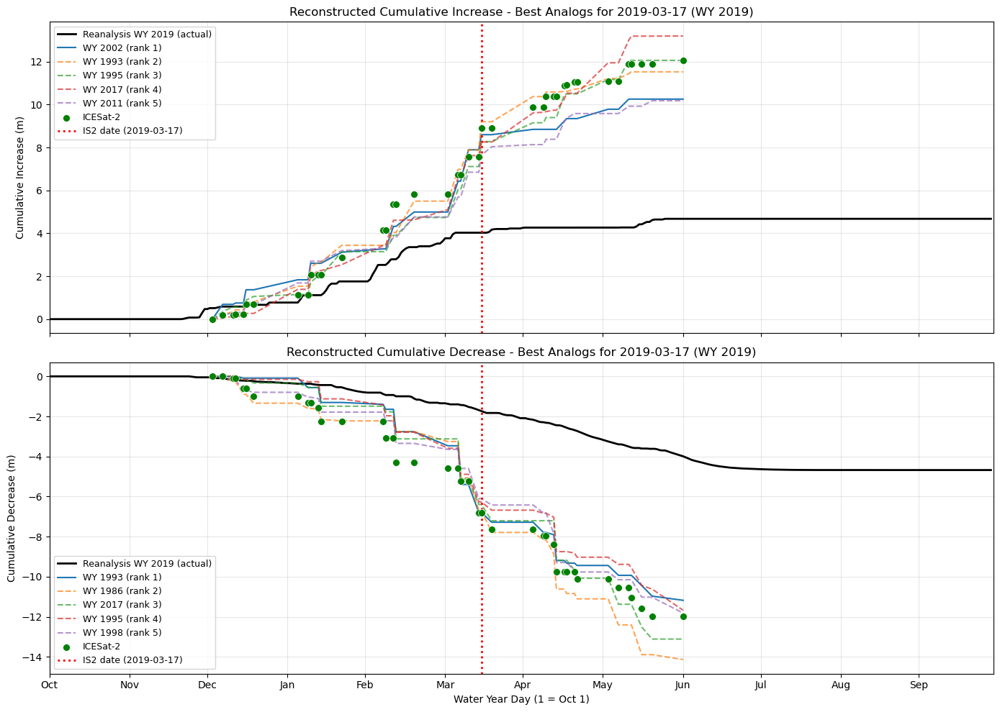


Best analog years for 2019-03-17:
  Cumulative Increase: [2002, 1993, 1995, 2017, 2011]
  Cumulative Decrease: [1993, 1986, 2017, 1995, 1998]


In [ ]:
# Plot reconstructed cumulative increases and decreases for 2019-03-17
is2_date = pd.Timestamp('2019-03-17')
is2_wy = get_water_year(is2_date)
wy_day = date_to_wy_day(is2_date)

# Get best analog years
best_inc_wys = best_analogs_spring_increase[is2_date]['water_year'].values[:5]
best_dec_wys = best_analogs_spring_decrease[is2_date]['water_year'].values[:5]

# Get ICESat-2 data for this water year
is2_wy_df = medians_both[medians_both['water_year'] == is2_wy].copy()
is2_wy_df['wy_day'] = is2_wy_df['date'].apply(date_to_wy_day)

# Get real reanalysis data for this water year and add wy_day
re_wy_actual = sd_df[sd_df['water_year'] == is2_wy].copy()
if len(re_wy_actual) > 0:
    re_wy_actual['wy_day'] = re_wy_actual['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))

fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Plot cumulative increase
if len(re_wy_actual) > 0:
    axes[0].plot(re_wy_actual['wy_day'], re_wy_actual['cumulative_increase'], 
                label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)

for i, hist_wy in enumerate(best_inc_wys):
    if hist_wy in reconstructed_timeseries[is2_wy]:
        df = reconstructed_timeseries[is2_wy][hist_wy]
        axes[0].plot(df['wy_day'], df['cumulative_increase'], 
                    label=f'WY {int(hist_wy)} (rank {i+1})', 
                    linestyle='--' if i > 0 else '-',
                    alpha=0.7 if i > 0 else 1.0,
                    linewidth=1.5)

if len(is2_wy_df) > 0:
    axes[0].scatter(is2_wy_df['wy_day'], is2_wy_df['cumulative_increase_snow_season'], 
                   label='ICESat-2', color='green', s=50, zorder=5, edgecolor='white', linewidth=0.5)

axes[0].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
axes[0].set_ylabel('Cumulative Increase (m)')
axes[0].set_title(f'Reconstructed Cumulative Increase - Best Analogs for {is2_date.date()} (WY {is2_wy})')
axes[0].legend(loc='upper left', fontsize=9)
axes[0].grid(alpha=0.3)

# Plot cumulative decrease
if len(re_wy_actual) > 0:
    axes[1].plot(re_wy_actual['wy_day'], re_wy_actual['cumulative_decrease'], 
                label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)

for i, hist_wy in enumerate(best_dec_wys):
    if hist_wy in reconstructed_timeseries[is2_wy]:
        df = reconstructed_timeseries[is2_wy][hist_wy]
        axes[1].plot(df['wy_day'], df['cumulative_decrease'], 
                    label=f'WY {int(hist_wy)} (rank {i+1})', 
                    linestyle='--' if i > 0 else '-',
                    alpha=0.7 if i > 0 else 1.0,
                    linewidth=1.5)

if len(is2_wy_df) > 0:
    axes[1].scatter(is2_wy_df['wy_day'], is2_wy_df['cumulative_decrease_snow_season'], 
                   label='ICESat-2', color='green', s=50, zorder=5, edgecolor='white', linewidth=0.5)

axes[1].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
axes[1].set_ylabel('Cumulative Decrease (m)')
axes[1].set_xlabel('Water Year Day (1 = Oct 1)')
axes[1].set_title(f'Reconstructed Cumulative Decrease - Best Analogs for {is2_date.date()} (WY {is2_wy})')
axes[1].legend(loc='lower left', fontsize=9)
axes[1].grid(alpha=0.3)

axes[1].set_xlim(1, 366)
axes[1].set_xticks([1, 32, 62, 93, 123, 154, 184, 215, 246, 276, 307, 337])
axes[1].set_xticklabels(['Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep'])

plt.tight_layout()
plt.show()

print(f"\nBest analog years for 2019-03-17:")
print(f"  Cumulative Increase: {[int(wy) for wy in best_inc_wys]}")
print(f"  Cumulative Decrease: {[int(wy) for wy in best_dec_wys]}")

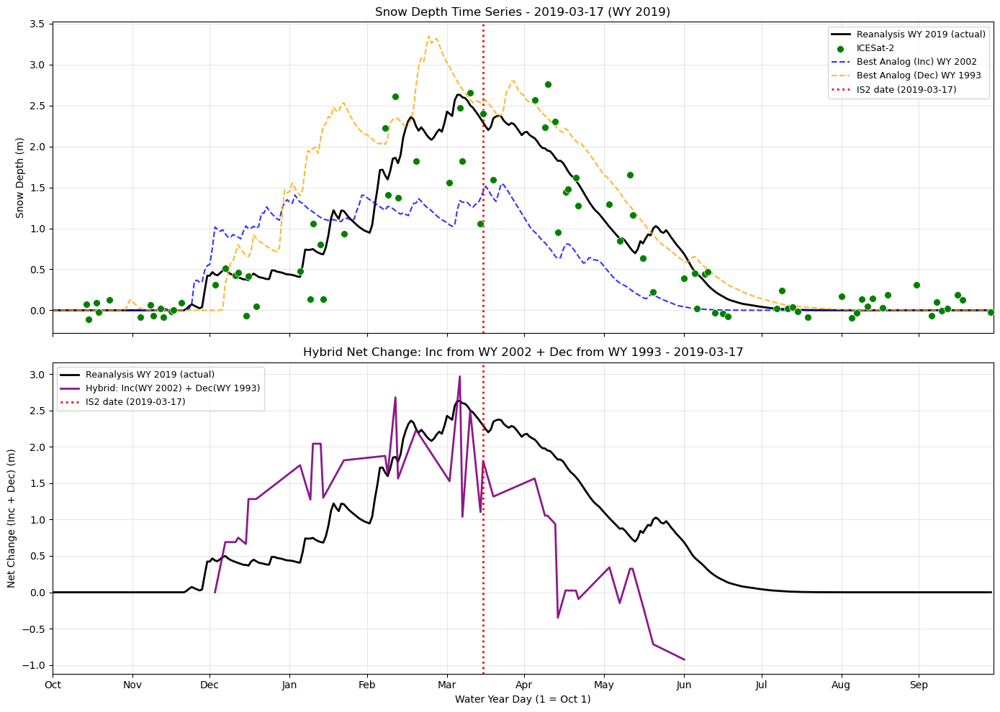


2019-03-17: Best analog by increases = WY 2002, Best analog by decreases = WY 1993


In [ ]:
# Plot for 2019-03-17 specifically
is2_date = pd.Timestamp('2019-03-17')
is2_wy = get_water_year(is2_date)
wy_day = date_to_wy_day(is2_date)

# Get best analog years (rank 1 only)
best_inc_wy = best_analogs_spring_increase[is2_date]['water_year'].values[0]
best_dec_wy = best_analogs_spring_decrease[is2_date]['water_year'].values[0]

# Get ICESat-2 data for this water year (actual snow depth values)
is2_wy_df = medians_both[medians_both['water_year'] == is2_wy].copy()
is2_wy_df['wy_day'] = is2_wy_df['date'].apply(date_to_wy_day)

# Get real reanalysis data for this water year (actual snow depth values)
re_wy_actual = sd_df[sd_df['water_year'] == is2_wy].copy()
if len(re_wy_actual) > 0:
    re_wy_actual['wy_day'] = re_wy_actual['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))

# Get reconstructed analog timeseries for best increase and decrease years
best_inc_ts = reconstructed_timeseries[is2_wy].get(best_inc_wy, None)
best_dec_ts = reconstructed_timeseries[is2_wy].get(best_dec_wy, None)

fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# ----- Top panel: Snow Depth Values -----
if len(re_wy_actual) > 0:
    axes[0].plot(re_wy_actual['wy_day'], re_wy_actual['median_sd'], 
                label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)

if len(is2_wy_df) > 0:
    axes[0].scatter(is2_wy_df['wy_day'], is2_wy_df['icesat2_3dep_dif'], 
                   label='ICESat-2', color='green', s=50, zorder=5, edgecolor='white', linewidth=0.5)

re_best_inc = sd_df[sd_df['water_year'] == best_inc_wy].copy()
if len(re_best_inc) > 0:
    re_best_inc['wy_day'] = re_best_inc['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))
    axes[0].plot(re_best_inc['wy_day'], re_best_inc['median_sd'], 
                label=f'Best Analog (Inc) WY {int(best_inc_wy)}', color='blue', 
                linestyle='--', linewidth=1.5, alpha=0.8)

if best_dec_wy != best_inc_wy:
    re_best_dec = sd_df[sd_df['water_year'] == best_dec_wy].copy()
    if len(re_best_dec) > 0:
        re_best_dec['wy_day'] = re_best_dec['time'].apply(lambda t: date_to_wy_day(pd.Timestamp(t)))
        axes[0].plot(re_best_dec['wy_day'], re_best_dec['median_sd'], 
                    label=f'Best Analog (Dec) WY {int(best_dec_wy)}', color='orange', 
                    linestyle='--', linewidth=1.5, alpha=0.8)

axes[0].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
axes[0].set_ylabel('Snow Depth (m)')
axes[0].set_title(f'Snow Depth Time Series - {is2_date.date()} (WY {is2_wy})')
axes[0].legend(loc='upper right', fontsize=9)
axes[0].grid(alpha=0.3)

# ----- Bottom panel: Hybrid Net Change -----
if len(re_wy_actual) > 0:
    net_change_actual = re_wy_actual['cumulative_increase'] + re_wy_actual['cumulative_decrease']
    axes[1].plot(re_wy_actual['wy_day'], net_change_actual, 
                label=f'Reanalysis WY {is2_wy} (actual)', color='black', linewidth=2)

if best_inc_ts is not None and best_dec_ts is not None:
    hybrid_df = best_inc_ts[['wy_day', 'cumulative_increase']].merge(
        best_dec_ts[['wy_day', 'cumulative_decrease']], on='wy_day', how='inner')
    hybrid_net = hybrid_df['cumulative_increase'] + hybrid_df['cumulative_decrease']
    axes[1].plot(hybrid_df['wy_day'], hybrid_net, 
                label=f'Hybrid: Inc(WY {int(best_inc_wy)}) + Dec(WY {int(best_dec_wy)})', 
                color='purple', linestyle='-', linewidth=2, alpha=0.9)

axes[1].axvline(wy_day, color='red', linestyle=':', linewidth=2, label=f'IS2 date ({is2_date.date()})')
axes[1].set_ylabel('Net Change (Inc + Dec) (m)')
axes[1].set_xlabel('Water Year Day (1 = Oct 1)')
axes[1].set_title(f'Hybrid Net Change: Inc from WY {int(best_inc_wy)} + Dec from WY {int(best_dec_wy)} - {is2_date.date()}')
axes[1].legend(loc='upper left', fontsize=9)
axes[1].grid(alpha=0.3)

axes[1].set_xlim(1, 366)
axes[1].set_xticks([1, 32, 62, 93, 123, 154, 184, 215, 246, 276, 307, 337])
axes[1].set_xticklabels(['Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep'])

plt.tight_layout()
plt.show()

print(f"\n2019-03-17: Best analog by increases = WY {int(best_inc_wy)}, Best analog by decreases = WY {int(best_dec_wy)}")

In [ ]:
# Save the results
import pickle

# Save the key outputs
results_to_save = {
    'is2_date_analog_sd': is2_date_analog_sd,
    'reconstructed_timeseries': reconstructed_timeseries,
    'best_analogs_spring_increase': best_analogs_spring_increase,
    'best_analogs_spring_decrease': best_analogs_spring_decrease,
    'summary_df': summary_df
}

output_path = Path('../../data/results/spatial_analog_results.pkl')
output_path.parent.mkdir(parents=True, exist_ok=True)

with open(output_path, 'wb') as f:
    pickle.dump(results_to_save, f)

print(f"Results saved to {output_path}")

# Also save summary as CSV
summary_df.to_csv(output_path.with_suffix('.csv'), index=False)
print(f"Summary saved to {output_path.with_suffix('.csv')}")

Results saved to ../../data/results/spatial_analog_results.pkl
Summary saved to ../../data/results/spatial_analog_results.csv


### thoughts on the above method:  
* I'm not sure the timeseries plots of the snow season give me the full illustration of this method that I want. Do I actually want to plot the real snow depth from the reanalysis instead of the cumulative increases and decreases?  
* Also, why would the 2020 plot have negative snow depth at the timing of the icesat2 track? shouldnt the snow depth match pretty well? i need to think more about what I'm doing here, since i'm just plotting the actual icesat2 values (not the decrease/increase) this might not actually hold true?  
* Given the time series of these, I'm thinking I'll need to test two things: 
    1) What Jessica and I talked about doing: calculate gridcell cumulative increase and decrease of swe from the best years for each, and add them together at the date of the icesat2 track to estimate swe. 
    2) Look more into what Justin did in terms of normalized spatial patterns instead of actual SWE values, and do something similar to what he did? Although maybe he used the cumulative increase to approximate snow fall and then put that into a model...need to think about this more and maybe talk to Justin again. 

for each year of swe reanalysis data (load one yearly file):  
* either duplicate this file or add two variables that have the cumulative increase (one variable) and cumulative decrease (second variable) at each gridcell for the water year.  
* might need to save these out as daily files?  - I don't think this will be necessary since for each icesat2 date I'll only need to access two years of files?
* 

### Next Steps:  
1) For each reanalysis year:
    * Load either the yearly swe file from swe_reanalysis_pca/data/download/{year} or data/reanlysis/daily_swe_files/{year}, which ever will be faster given the below computations. 
    * for dates of each year in the 'snow season', calculate the cumulative increase for each grid cell. Save each day's increases as its own file (similar to the daily swe files in data/reanalysis/daily_swe_files/{year}) in a new folder in data/reanalysis/daily_swe_increase_files. Also calculate the cumulative decrease for each grid cell. Save each day's decreases in a new folder in data/reanalysis/daily_swe_increase_files.  
2) For each ICESat-2 date:  
    * identify which year was best for increases and which year was best for decreases - we already calculated this above. 
    * for the best increase year, grab the daily increase swe file (from data/reanalysis_swe_files/{year}) that corresponds to the icesat2 date. For the best decrease year, do the same for the decrease swe file. 
    * Add these two daily swe files together.  
    * plot the original reanalysis data from the icesat2 date, the spatial map of the added together increases and decreases, and the difference map between the two. 

In [ ]:
atl06sr_gdf_snowy.columns

Index(['segment_watermask', 'segment_snowcover', 'pflags', '3dep.value',
       'region', '3dep.deriv.slope', 'gt', 'n_fit_photons',
       'w_surface_window_final', '3dep.fileid', 'rgt', 'rms_misfit',
       '3dep.deriv.count', '3dep.deriv.aspect', 'h_mean', 'dh_fit_dx', 'x_atc',
       'h_sigma', 'spot', 'y_atc', 'urban_flag', '3dep.time_ns',
       'beam_azimuth', 'srcid', 'segment_landcover', 'cycle', 'photon_start',
       'geometry', 'time', 'slope_count', 'slope', 'aspect', 'file', 'value',
       'time_acq', 'doy', 'decyear', 'dowy', 'acqdate', 'reanalysis_swe',
       'reanalysis_sca', 'reanalysis_sd', 'icesat2_3dep_dif', 'dif_plus',
       'offset_sd', 'mask', 'acqdate_dt', 'n'],
      dtype='object')

In [ ]:
(atl06sr_gdf_snowy['3dep.deriv.slope'] - atl06sr_gdf_snowy['slope']).describe()

count    1.447040e+06
mean     3.095319e-02
std      9.547187e-01
min     -1.911300e+01
25%      2.871245e-08
50%      1.917457e-07
75%      4.952652e-07
max      3.095078e+01
dtype: float64

In [ ]:
# Check structure of daily SWE file
# Use absolute path since base_dir may be different
daily_swe_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/daily_SWE_files')
sample_swe_file = daily_swe_dir / '2019' / 'day_100.nc'
sample_swe_ds = xr.open_dataset(sample_swe_file)
sample_swe_ds

<xarray.Dataset> Size: 5MB
Dimensions:      (space: 1164373)
Coordinates:
    time         datetime64[ns] 8B ...
    spatial_ref  int64 8B ...
Dimensions without coordinates: space
Data variables:
    SWE_Post     (space) float32 5MB ...

In [ ]:
# Check spatial_coords file
spatial_coords_file = daily_swe_dir / 'spatial_coords.nc'
spatial_coords_ds = xr.open_dataset(spatial_coords_file)
spatial_coords_ds

<xarray.Dataset> Size: 9MB
Dimensions:  (space: 1164373)
Dimensions without coordinates: space
Data variables:
    x        (space) float32 5MB ...
    y        (space) float32 5MB ...
Attributes:
    n_points:     1164373
    description:  Spatial coordinates for stacked daily SWE files

## SWE Spatial Analog Analysis

### Step 1: Generate daily cumulative increase/decrease files for each water year

For each reanalysis year, calculate the cumulative SWE increase and decrease for each grid cell through the snow season, saving daily files.

In [ ]:
# Step 1: Generate daily cumulative SWE increase/decrease files for each water year
# This computes the cumulative increase and decrease for EVERY grid cell on each day

from pathlib import Path
import numpy as np
import xarray as xr
from tqdm import tqdm

# Define paths
daily_swe_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/daily_SWE_files')
daily_swe_increase_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/daily_swe_increase_files')
daily_swe_decrease_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/daily_swe_decrease_files')

# Create output directories
daily_swe_increase_dir.mkdir(parents=True, exist_ok=True)
daily_swe_decrease_dir.mkdir(parents=True, exist_ok=True)

# Get water years - use all_water_years from kernel
print(f"Processing water years: {all_water_years}")

# Add wy_day column to medians_both if not present
medians_both['wy_day'] = medians_both['date'].apply(lambda d: date_to_wy_day(pd.Timestamp(d)))

# Get snow season range from medians_both (where in_snow_season == True)
snow_season_df = medians_both[medians_both['in_snow_season'] == True]
snow_season_start_wy_day = snow_season_df['wy_day'].min()
snow_season_end_wy_day = snow_season_df['wy_day'].max()
print(f"Snow season WY days: {snow_season_start_wy_day} to {snow_season_end_wy_day}")

Processing water years: [1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
Snow season WY days: 62 to 246


In [ ]:
# Process each water year to create cumulative increase/decrease files
# For each day, compute cumulative sum of positive changes (increase) and negative changes (decrease)
# FIXED: Use calendar day-of-year when reading from daily_SWE_files (input)
#        Output files use wy_day naming for consistency with water year analysis

def process_water_year_cumulative_swe(wy, daily_swe_dir, daily_swe_increase_dir, daily_swe_decrease_dir,
                                       snow_season_start_wy_day, snow_season_end_wy_day):
    """
    For a given water year, compute daily cumulative SWE increase and decrease for each grid cell.
    
    For each day d in the snow season:
        - cumulative_increase[d] = sum of all positive daily SWE changes from day 1 to d
        - cumulative_decrease[d] = sum of all negative daily SWE changes from day 1 to d (stored as negative)
    
    NOTE: Input daily_SWE_files are named by calendar day-of-year.
          Output cumulative files are named by water year day for consistency.
    """
    wy_swe_dir = daily_swe_dir / str(wy)
    wy_inc_dir = daily_swe_increase_dir / str(wy)
    wy_dec_dir = daily_swe_decrease_dir / str(wy)
    
    wy_inc_dir.mkdir(parents=True, exist_ok=True)
    wy_dec_dir.mkdir(parents=True, exist_ok=True)
    
    # Load all days from day 1 to snow_season_end_wy_day
    # We need data starting from day 1 to compute cumulative changes
    # FIXED: Convert wy_day=1 to calendar day for file lookup
    first_day_calendar = wy_day_to_calendar_day(1, wy)
    first_day_file = wy_swe_dir / f'day_{first_day_calendar:03d}.nc'
    if not first_day_file.exists():
        print(f"  Skipping WY {wy} - no day_{first_day_calendar:03d}.nc found (wy_day=1)")
        return
    
    # Load first day's SWE to get shape and initialize
    first_ds = xr.open_dataset(first_day_file)
    
    # Handle both 'space' dimension (flattened) and 'x','y' dimensions (2D)
    if 'space' in first_ds.dims:
        is_flattened = True
        n_space = first_ds.dims['space']
        prev_swe = first_ds['SWE_Post'].values.copy()
    else:
        is_flattened = False
        # Flatten for computation, will save in flattened format
        prev_swe = first_ds['SWE_Post'].values.flatten().copy()
        n_space = len(prev_swe)
        print(f"  WY {wy} has 2D structure, flattening to {n_space} points")
    
    first_ds.close()
    
    # Initialize cumulative arrays (start at 0)
    cumulative_increase = np.zeros(n_space, dtype=np.float32)
    cumulative_decrease = np.zeros(n_space, dtype=np.float32)
    
    # Process each day from day 2 to end of snow season
    for wy_day in range(2, snow_season_end_wy_day + 1):
        # FIXED: Convert wy_day to calendar day for file lookup
        calendar_day = wy_day_to_calendar_day(wy_day, wy)
        day_file = wy_swe_dir / f'day_{calendar_day:03d}.nc'
        
        if not day_file.exists():
            continue
        
        # Load current day's SWE
        ds = xr.open_dataset(day_file)
        
        if is_flattened:
            current_swe = ds['SWE_Post'].values
        else:
            current_swe = ds['SWE_Post'].values.flatten()
        
        # Compute daily change
        daily_change = current_swe - prev_swe
        
        # Handle NaN values - set to 0 for change computation
        daily_change = np.nan_to_num(daily_change, nan=0.0)
        
        # Separate increases (positive) and decreases (negative)
        daily_increase = np.maximum(daily_change, 0)
        daily_decrease = np.minimum(daily_change, 0)  # Will be negative
        
        # Accumulate
        cumulative_increase += daily_increase
        cumulative_decrease += daily_decrease  # Stays negative
        
        # Only save files for days within snow season
        # Output files use wy_day naming (intentionally different from input)
        if wy_day >= snow_season_start_wy_day:
            # Save cumulative increase
            inc_ds = xr.Dataset({
                'cumulative_swe_increase': (['space'], cumulative_increase.copy()),
            }, coords={'time': ds['time'].values})
            inc_ds.attrs['wy_day'] = wy_day
            inc_ds.attrs['water_year'] = wy
            inc_ds.attrs['description'] = 'Cumulative SWE increase (sum of positive daily changes) from start of WY'
            inc_ds.to_netcdf(wy_inc_dir / f'day_{wy_day:03d}.nc')
            inc_ds.close()
            
            # Save cumulative decrease
            dec_ds = xr.Dataset({
                'cumulative_swe_decrease': (['space'], cumulative_decrease.copy()),
            }, coords={'time': ds['time'].values})
            dec_ds.attrs['wy_day'] = wy_day
            dec_ds.attrs['water_year'] = wy
            dec_ds.attrs['description'] = 'Cumulative SWE decrease (sum of negative daily changes) from start of WY'
            dec_ds.to_netcdf(wy_dec_dir / f'day_{wy_day:03d}.nc')
            dec_ds.close()
        
        # Update previous SWE
        prev_swe = current_swe.copy()
        ds.close()
    
    return

print("Function updated: reads input with calendar day, writes output with wy_day")

Function updated: reads input with calendar day, writes output with wy_day


In [ ]:
# Process all water years
print("Processing all water years for cumulative SWE increase/decrease...")

for wy in tqdm(all_water_years, desc="Water Years"):
    # Check if already processed
    test_file = daily_swe_increase_dir / str(wy) / f'day_{snow_season_end_wy_day:03d}.nc'
    if test_file.exists():
        continue  # Skip silently for progress bar
    
    process_water_year_cumulative_swe(wy, daily_swe_dir, daily_swe_increase_dir, daily_swe_decrease_dir,
                                       snow_season_start_wy_day, snow_season_end_wy_day)

print("\nAll water years processed!")

Processing all water years for cumulative SWE increase/decrease...


Water Years:   8%|▊         | 3/37 [00:12<02:21,  4.16s/it]

  WY 1988 has 2D structure, flattening to 1164373 points


Water Years: 100%|██████████| 37/37 [02:30<00:00,  4.06s/it]


All water years processed!


In [ ]:
# Verify the output files from WY 2019 test
test_inc_file = daily_swe_increase_dir / '2019' / 'day_100.nc'
test_dec_file = daily_swe_decrease_dir / '2019' / 'day_100.nc'

test_inc_ds = xr.open_dataset(test_inc_file)
test_dec_ds = xr.open_dataset(test_dec_file)

print("Cumulative Increase file:")
print(test_inc_ds)
print(f"\nCumulative increase stats: min={test_inc_ds['cumulative_swe_increase'].values.min():.4f}, "
      f"max={test_inc_ds['cumulative_swe_increase'].values.max():.4f}, "
      f"mean={np.nanmean(test_inc_ds['cumulative_swe_increase'].values):.4f}")

print("\n\nCumulative Decrease file:")
print(test_dec_ds)
print(f"\nCumulative decrease stats: min={test_dec_ds['cumulative_swe_decrease'].values.min():.4f}, "
      f"max={test_dec_ds['cumulative_swe_decrease'].values.max():.4f}, "
      f"mean={np.nanmean(test_dec_ds['cumulative_swe_decrease'].values):.4f}")

Cumulative Increase file:
<xarray.Dataset> Size: 5MB
Dimensions:                  (space: 1164373)
Coordinates:
    time                     datetime64[ns] 8B ...
Dimensions without coordinates: space
Data variables:
    cumulative_swe_increase  (space) float32 5MB ...
Attributes:
    wy_day:       100
    water_year:   2019
    description:  Cumulative SWE increase (sum of positive daily changes) fro...

Cumulative increase stats: min=0.0000, max=0.8336, mean=0.0234


Cumulative Decrease file:
<xarray.Dataset> Size: 5MB
Dimensions:                  (space: 1164373)
Coordinates:
    time                     datetime64[ns] 8B ...
Dimensions without coordinates: space
Data variables:
    cumulative_swe_decrease  (space) float32 5MB ...
Attributes:
    wy_day:       100
    water_year:   2019
    description:  Cumulative SWE decrease (sum of negative daily changes) fro...

Cumulative decrease stats: min=-0.4436, max=0.0000, mean=-0.0038


In [ ]:
# Check which years have proper files
for wy in all_water_years[:5]:  # Check first 5
    test_file = daily_swe_dir / str(wy) / 'day_001.nc'
    if test_file.exists():
        ds = xr.open_dataset(test_file)
        print(f"WY {wy}: dims={dict(ds.dims)}, vars={list(ds.data_vars)}")
        ds.close()
    else:
        print(f"WY {wy}: day_001.nc does not exist")

WY 1985: dims={'space': 1164373}, vars=['SWE_Post']
WY 1986: dims={'space': 1164373}, vars=['SWE_Post']
WY 1987: dims={'space': 1164373}, vars=['SWE_Post']
WY 1988: dims={'y': 1267, 'x': 919}, vars=['SWE_Post']
WY 1989: dims={'space': 1164373}, vars=['SWE_Post']


### Step 2a: Create Combined Hybrid SWE Files

For each ICESat-2 date:
1. Get the best increase year and best decrease year (from `best_analogs_spring_increase` and `best_analogs_spring_decrease`)
2. Load the cumulative increase from the best increase year
3. Load the cumulative decrease from the best decrease year  
4. Add them together to get the hybrid SWE estimate
5. Save to a new file in `data/reanalysis/hybrid_swe_files/`

In [ ]:
# Step 2a: Setup for creating hybrid SWE files
# Load spatial coordinates (needed for saving files with proper structure)
spatial_coords_file = daily_swe_dir / 'spatial_coords.nc'
spatial_coords_ds = xr.open_dataset(spatial_coords_file)
x_coords = spatial_coords_ds['x'].values
y_coords = spatial_coords_ds['y'].values
spatial_coords_ds.close()

# Create output directory for hybrid SWE files
hybrid_swe_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/hybrid_swe_files')
hybrid_swe_dir.mkdir(parents=True, exist_ok=True)

print(f"Loaded spatial coordinates: {len(x_coords)} points")
print(f"Output directory: {hybrid_swe_dir}")

Loaded spatial coordinates: 1164373 points
Output directory: /Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/hybrid_swe_files


In [ ]:
# Check available ICESat-2 snow season dates and their best analog years
available_dates = list(best_analogs_spring_increase.keys())
print(f"Number of available ICESat-2 dates with best analogs: {len(available_dates)}")
print(f"Date range: {min(available_dates)} to {max(available_dates)}")

Number of available ICESat-2 dates with best analogs: 44
Date range: 2019-03-04 00:00:00 to 2021-04-11 00:00:00


In [ ]:
# Step 2a: Function to create and save hybrid SWE files
# FIXED: Use calendar day when reading from daily_swe_dir (original reanalysis files)
#        Use wy_day when reading from cumulative increase/decrease files (our generated files)

def create_hybrid_swe_file(is2_date, best_analogs_spring_increase, best_analogs_spring_decrease,
                            daily_swe_dir, daily_swe_increase_dir, daily_swe_decrease_dir,
                            hybrid_swe_dir, x_coords, y_coords):
    """
    Create a hybrid SWE file by combining:
    - Cumulative increase from the best increase year
    - Cumulative decrease from the best decrease year
    
    Saves the hybrid SWE along with the actual reanalysis SWE for comparison.
    
    Returns a dict with metadata if successful, None otherwise.
    """
    # Get the ICESat-2 date info
    is2_wy = get_water_year(is2_date)
    is2_wy_day = date_to_wy_day(is2_date)
    
    # FIXED: Convert to calendar day for reading from daily_swe_dir (original reanalysis)
    is2_calendar_day = wy_day_to_calendar_day(is2_wy_day, is2_wy)
    
    # Get best analog years (first row, water_year column)
    best_inc_df = best_analogs_spring_increase[is2_date]
    best_dec_df = best_analogs_spring_decrease[is2_date]
    best_inc_wy = int(best_inc_df.iloc[0]['water_year'])
    best_dec_wy = int(best_dec_df.iloc[0]['water_year'])
    
    # Load actual reanalysis SWE from the ICESat-2 date's year
    # FIXED: Use calendar day for original reanalysis files
    actual_swe_file = daily_swe_dir / str(is2_wy) / f'day_{is2_calendar_day:03d}.nc'
    if not actual_swe_file.exists():
        return None
    
    actual_ds = xr.open_dataset(actual_swe_file)
    if 'space' in actual_ds.dims:
        actual_swe = actual_ds['SWE_Post'].values
    else:
        actual_swe = actual_ds['SWE_Post'].values.flatten()
    actual_ds.close()
    
    # Load cumulative increase from best increase year
    # These files use wy_day naming (our generated files)
    inc_file = daily_swe_increase_dir / str(best_inc_wy) / f'day_{is2_wy_day:03d}.nc'
    if not inc_file.exists():
        return None
    
    inc_ds = xr.open_dataset(inc_file)
    cumulative_increase = inc_ds['cumulative_swe_increase'].values
    inc_ds.close()
    
    # Load cumulative decrease from best decrease year
    # These files use wy_day naming (our generated files)
    dec_file = daily_swe_decrease_dir / str(best_dec_wy) / f'day_{is2_wy_day:03d}.nc'
    if not dec_file.exists():
        return None
    
    dec_ds = xr.open_dataset(dec_file)
    cumulative_decrease = dec_ds['cumulative_swe_decrease'].values
    dec_ds.close()
    
    # Compute hybrid SWE estimate
    hybrid_swe = cumulative_increase + cumulative_decrease
    
    # Compute difference (hybrid - actual)
    difference = hybrid_swe - actual_swe
    
    # Create output dataset
    out_ds = xr.Dataset(
        {
            'hybrid_swe': (['space'], hybrid_swe.astype(np.float32)),
            'actual_swe': (['space'], actual_swe.astype(np.float32)),
            'cumulative_increase': (['space'], cumulative_increase.astype(np.float32)),
            'cumulative_decrease': (['space'], cumulative_decrease.astype(np.float32)),
            'difference': (['space'], difference.astype(np.float32)),
            'x': (['space'], x_coords.astype(np.float32)),
            'y': (['space'], y_coords.astype(np.float32)),
        },
        coords={
            'time': is2_date,
        },
        attrs={
            'is2_date': str(is2_date),
            'is2_water_year': is2_wy,
            'is2_wy_day': is2_wy_day,
            'is2_calendar_day': is2_calendar_day,
            'best_increase_wy': best_inc_wy,
            'best_decrease_wy': best_dec_wy,
            'description': 'Hybrid SWE estimate from spatial analog analysis',
        }
    )
    
    # Save to file
    out_file = hybrid_swe_dir / f'hybrid_swe_{is2_date.strftime("%Y%m%d")}.nc'
    out_ds.to_netcdf(out_file)
    out_ds.close()
    
    # Return metadata
    valid_mask = ~np.isnan(actual_swe) & ~np.isnan(hybrid_swe)
    return {
        'is2_date': is2_date,
        'is2_wy': is2_wy,
        'is2_wy_day': is2_wy_day,
        'is2_calendar_day': is2_calendar_day,
        'best_inc_wy': best_inc_wy,
        'best_dec_wy': best_dec_wy,
        'mean_actual_swe': np.nanmean(actual_swe),
        'mean_hybrid_swe': np.nanmean(hybrid_swe),
        'mean_difference': np.nanmean(difference),
        'rmse': np.sqrt(np.nanmean(difference**2)),
        'correlation': np.corrcoef(actual_swe[valid_mask], hybrid_swe[valid_mask])[0, 1] if valid_mask.sum() > 10 else np.nan,
        'output_file': str(out_file),
    }

print("Function defined for creating hybrid SWE files (fixed day indexing)")

Function defined for creating hybrid SWE files (fixed day indexing)


In [ ]:
# Step 2a: Create hybrid SWE files for all available ICESat-2 dates
print(f"Creating hybrid SWE files for {len(available_dates)} ICESat-2 dates...")

all_results = []
for is2_date in tqdm(available_dates, desc="Creating hybrid SWE files"):
    result = create_hybrid_swe_file(
        is2_date,
        best_analogs_spring_increase,
        best_analogs_spring_decrease,
        daily_swe_dir,
        daily_swe_increase_dir,
        daily_swe_decrease_dir,
        hybrid_swe_dir,
        x_coords,
        y_coords
    )
    
    if result:
        all_results.append(result)

print(f"\nSuccessfully created {len(all_results)} hybrid SWE files")
print(f"Output directory: {hybrid_swe_dir}")

Creating hybrid SWE files for 44 ICESat-2 dates...


Creating hybrid SWE files: 100%|██████████| 44/44 [00:02<00:00, 19.13it/s]


Successfully created 44 hybrid SWE files
Output directory: /Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/hybrid_swe_files


In [ ]:
# Step 2a: Save summary statistics to CSV
results_df = pd.DataFrame(all_results)
results_df.to_csv(hybrid_swe_dir / 'hybrid_swe_summary.csv', index=False)

print(f"Summary statistics:")
print(f"  Mean RMSE: {results_df['rmse'].mean():.4f} m")
print(f"  Mean correlation: {results_df['correlation'].mean():.4f}")
print(f"  Mean bias (hybrid - actual): {results_df['mean_difference'].mean():.4f} m")

results_df.head(10)

Summary statistics:
  Mean RMSE: 0.2344 m
  Mean correlation: 0.8449
  Mean bias (hybrid - actual): 0.0556 m


,is2_date,is2_wy,is2_wy_day,is2_calendar_day,best_inc_wy,best_dec_wy,mean_actual_swe,mean_hybrid_swe,mean_difference,rmse,correlation,output_file
0,2019-03-04,2019,155,63,1993,2002,0.335296,0.128258,0.128316,0.251085,0.916908,/Users/hannah/Documents/Grad_Documents/Researc...
1,2019-03-08,2019,159,67,2017,2002,0.360242,0.109026,0.033851,0.220013,0.924832,/Users/hannah/Documents/Grad_Documents/Researc...
2,2019-03-09,2019,160,68,2017,2017,0.362111,0.110823,0.038478,0.207564,0.941549,/Users/hannah/Documents/Grad_Documents/Researc...
3,2019-03-12,2019,163,71,2017,2017,0.362711,0.107975,0.027585,0.206388,0.939178,/Users/hannah/Documents/Grad_Documents/Researc...
4,2019-03-16,2019,167,75,2017,1993,0.356536,0.100243,0.005809,0.218761,0.933553,/Users/hannah/Documents/Grad_Documents/Researc...
5,2019-03-17,2019,168,76,2002,1993,0.352971,0.039463,-0.210326,0.307553,0.902663,/Users/hannah/Documents/Grad_Documents/Researc...
6,2019-03-21,2019,172,80,2002,1986,0.349791,0.038161,-0.211851,0.345055,0.858860,/Users/hannah/Documents/Grad_Documents/Researc...
7,2019-04-06,2019,188,96,1986,1986,0.330310,0.076075,-0.055325,0.230407,0.899515,/Users/hannah/Documents/Grad_Documents/Researc...
8,2019-04-10,2019,192,100,1986,2002,0.315400,0.086634,-0.002248,0.228552,0.899492,/Users/hannah/Documents/Grad_Documents/Researc...
9,2019-04-11,2019,193,101,1993,2002,0.312779,0.119365,0.118688,0.257917,0.896352,/Users/hannah/Documents/Grad_Documents/Researc...


### Step 2b: Visualize Hybrid SWE vs Actual SWE

Load the saved hybrid SWE files and create comparison plots.

In [ ]:
# Step 2b: Function to plot hybrid SWE comparison from saved files
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

def plot_hybrid_swe_comparison(hybrid_file_path, save_fig_path=None):
    """
    Load a hybrid SWE file and create a 3-panel comparison figure:
    1. Actual reanalysis SWE
    2. Hybrid SWE estimate  
    3. Difference (Hybrid - Actual)
    """
    ds = xr.open_dataset(hybrid_file_path)
    
    # Extract data
    actual_swe = ds['actual_swe'].values
    hybrid_swe = ds['hybrid_swe'].values
    difference = ds['difference'].values
    x = ds['x'].values
    y = ds['y'].values
    
    # Get metadata
    is2_date = pd.Timestamp(ds.attrs['is2_date'])
    is2_wy = ds.attrs['is2_water_year']
    best_inc_wy = ds.attrs['best_increase_wy']
    best_dec_wy = ds.attrs['best_decrease_wy']
    
    ds.close()
    
    # Create figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Common colorbar settings for SWE
    vmax_swe = max(np.nanpercentile(actual_swe, 99), np.nanpercentile(hybrid_swe, 99))
    vmin_swe = 0
    
    # Panel 1: Actual reanalysis SWE
    sc1 = axes[0].scatter(x, y, c=actual_swe, s=0.1, cmap='Blues', 
                           vmin=vmin_swe, vmax=vmax_swe, rasterized=True)
    axes[0].set_title(f'Actual Reanalysis SWE\nWY {is2_wy} (IS-2 Date: {is2_date.strftime("%Y-%m-%d")})')
    axes[0].set_xlabel('Longitude')
    axes[0].set_ylabel('Latitude')
    plt.colorbar(sc1, ax=axes[0], label='SWE (m)')
    
    # Panel 2: Hybrid SWE
    sc2 = axes[1].scatter(x, y, c=hybrid_swe, s=0.1, cmap='Blues',
                           vmin=vmin_swe, vmax=vmax_swe, rasterized=True)
    axes[1].set_title(f'Hybrid SWE Estimate\nInc from WY {best_inc_wy} + Dec from WY {best_dec_wy}')
    axes[1].set_xlabel('Longitude')
    axes[1].set_ylabel('Latitude')
    plt.colorbar(sc2, ax=axes[1], label='SWE (m)')
    
    # Panel 3: Difference (diverging colormap - blue=positive, red=negative)
    vmax_diff = np.nanpercentile(np.abs(difference), 95)
    norm = TwoSlopeNorm(vmin=-vmax_diff, vcenter=0, vmax=vmax_diff)
    sc3 = axes[2].scatter(x, y, c=difference, s=0.1, cmap='RdBu',
                           norm=norm, rasterized=True)
    
    # Compute stats
    valid_mask = ~np.isnan(actual_swe) & ~np.isnan(hybrid_swe)
    corr = np.corrcoef(actual_swe[valid_mask], hybrid_swe[valid_mask])[0, 1] if valid_mask.sum() > 10 else np.nan
    
    axes[2].set_title(f'Difference (Hybrid - Actual)\nMean: {np.nanmean(difference):.4f} m, Corr: {corr:.3f}')
    axes[2].set_xlabel('Longitude')
    axes[2].set_ylabel('Latitude')
    plt.colorbar(sc3, ax=axes[2], label='SWE Difference (m)')
    
    plt.tight_layout()
    
    if save_fig_path:
        plt.savefig(save_fig_path, dpi=150, bbox_inches='tight')
    
    plt.show()
    
    return {
        'is2_date': is2_date,
        'mean_difference': np.nanmean(difference),
        'correlation': corr
    }

print("Plotting function defined")

Plotting function defined


In [ ]:
# Step 2b: List available hybrid SWE files
hybrid_files = sorted(hybrid_swe_dir.glob('hybrid_swe_*.nc'))
print(f"Found {len(hybrid_files)} hybrid SWE files")

# Show a sample of the files
for f in hybrid_files[:5]:
    print(f"  {f.name}")

Found 44 hybrid SWE files
  hybrid_swe_20190304.nc
  hybrid_swe_20190308.nc
  hybrid_swe_20190309.nc
  hybrid_swe_20190312.nc
  hybrid_swe_20190316.nc


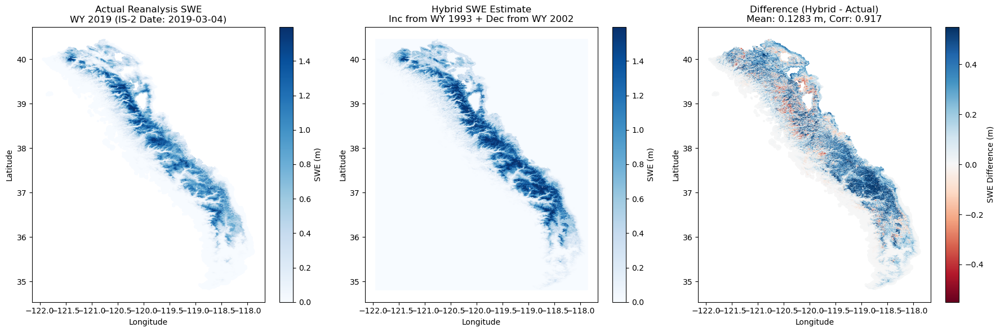


Saved figure to: /Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/figures/hybrid_swe_maps/hybrid_swe_20190304.png


In [ ]:
# Step 2b: Plot a single example
# Create figures directory
hybrid_figs_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/figures/hybrid_swe_maps')
hybrid_figs_dir.mkdir(parents=True, exist_ok=True)

# Plot the first available file
if len(hybrid_files) > 0:
    example_file = hybrid_files[0]
    fig_path = hybrid_figs_dir / example_file.name.replace('.nc', '.png')
    result = plot_hybrid_swe_comparison(example_file, save_fig_path=fig_path)
    print(f"\nSaved figure to: {fig_path}")

### this cell is rerun with the fixed files:

Creating plots for 9 files (every 5th)...


Creating plots:   0%|          | 0/9 [00:00<?, ?it/s]

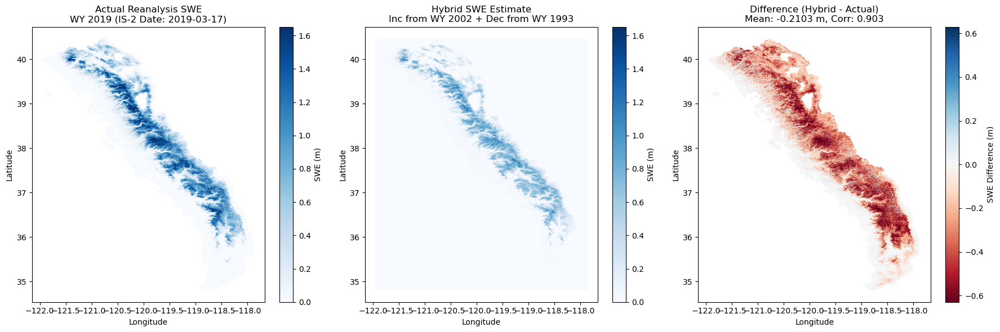

Creating plots:  22%|██▏       | 2/9 [00:38<02:14, 19.20s/it]

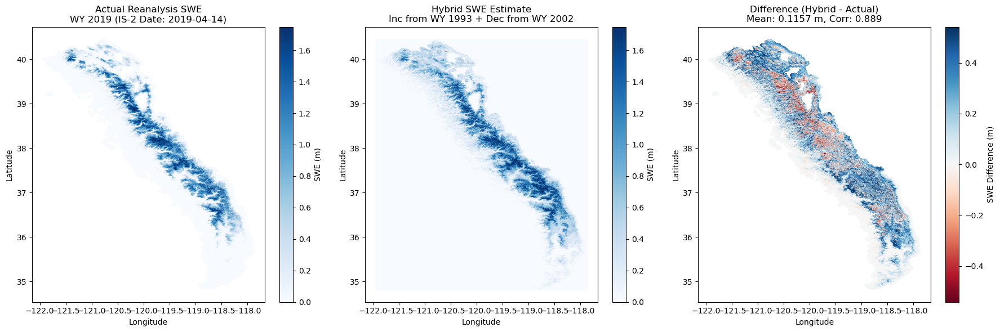

Creating plots:  33%|███▎      | 3/9 [01:16<02:41, 26.89s/it]

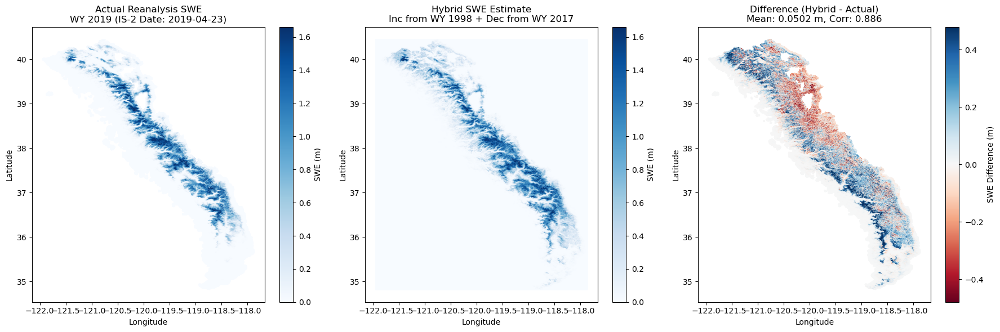

Creating plots:  44%|████▍     | 4/9 [01:53<02:33, 30.73s/it]

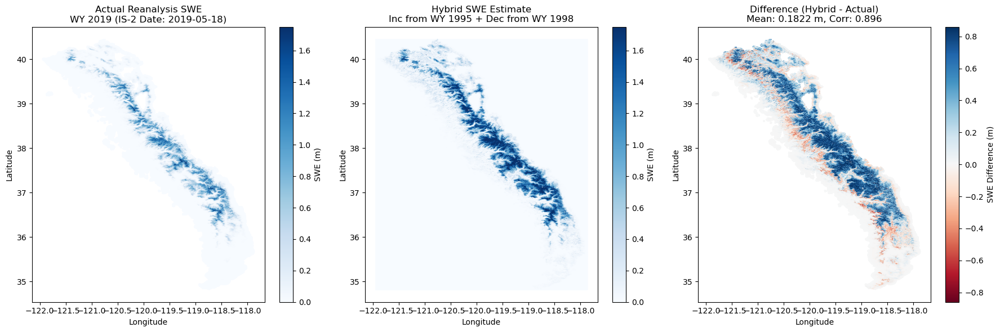

Creating plots:  56%|█████▌    | 5/9 [02:30<02:12, 33.09s/it]

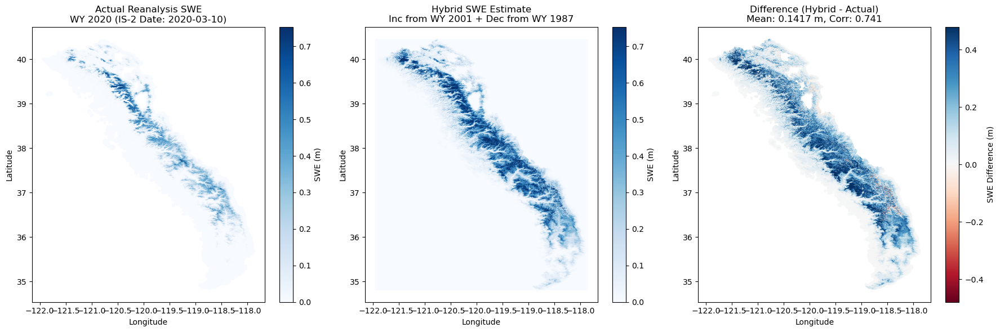

Creating plots:  67%|██████▋   | 6/9 [03:08<01:44, 34.67s/it]

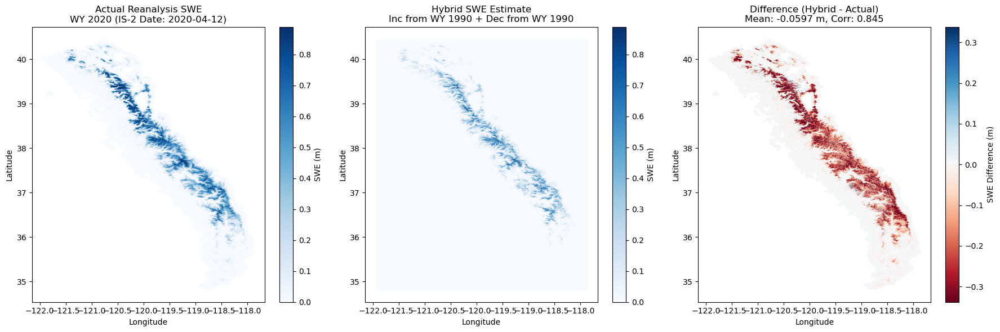

Creating plots:  78%|███████▊  | 7/9 [03:45<01:11, 35.50s/it]

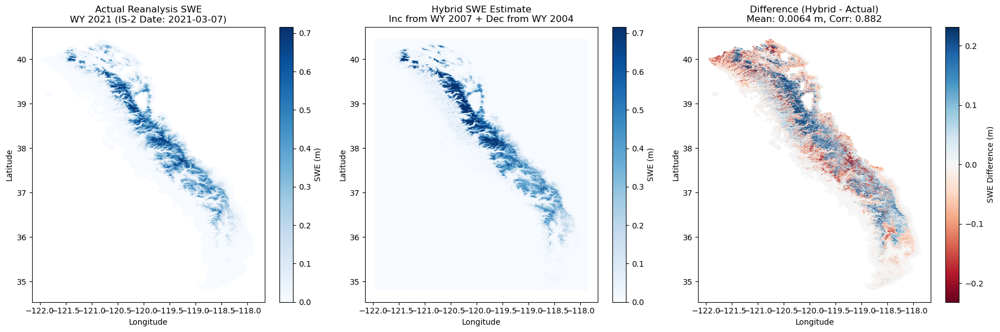

Creating plots:  89%|████████▉ | 8/9 [04:23<00:36, 36.03s/it]

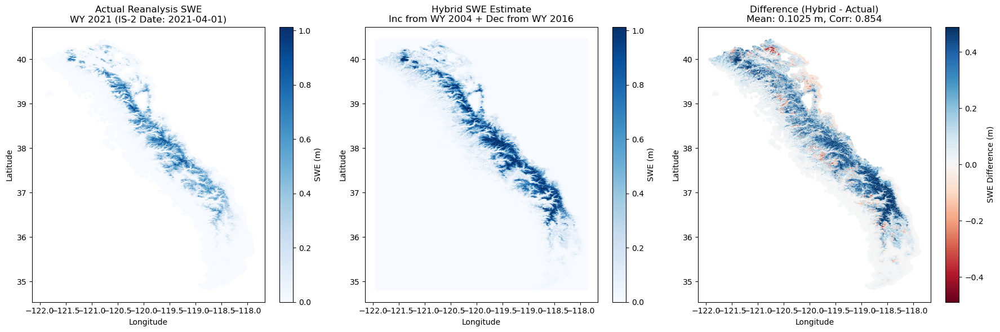

Creating plots: 100%|██████████| 9/9 [05:00<00:00, 33.36s/it]


Plots saved to: /Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/figures/hybrid_swe_maps


In [ ]:
# Step 2b: Create plots for all hybrid SWE files (or a sample)
# Process every Nth file to save time
N = 5  # Process every 5th file
sample_files = hybrid_files[::N]
print(f"Creating plots for {len(sample_files)} files (every {N}th)...")

for hybrid_file in tqdm(sample_files, desc="Creating plots"):
    fig_path = hybrid_figs_dir / hybrid_file.name.replace('.nc', '.png')
    if not fig_path.exists():  # Skip if already exists
        plot_hybrid_swe_comparison(hybrid_file, save_fig_path=fig_path)
        plt.close('all')

print(f"\nPlots saved to: {hybrid_figs_dir}")

### This cell makes old plots in the figures/hybrid_swe_maps_old folder

Creating plots for 9 files (every 5th)...


Creating plots:   0%|          | 0/9 [00:00<?, ?it/s]

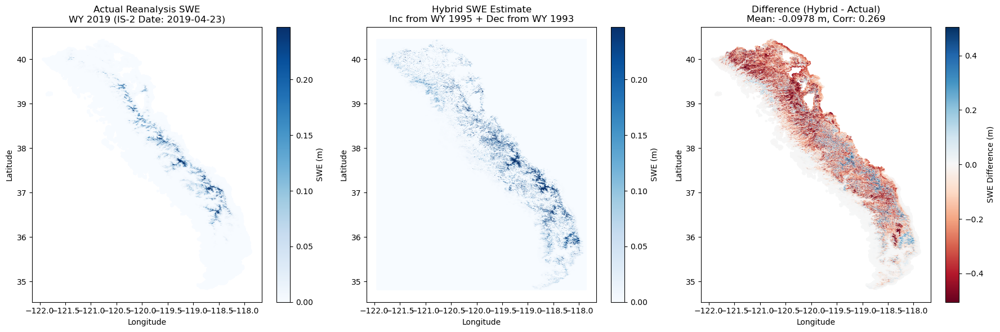

Creating plots:  44%|████▍     | 4/9 [00:37<00:46,  9.33s/it]

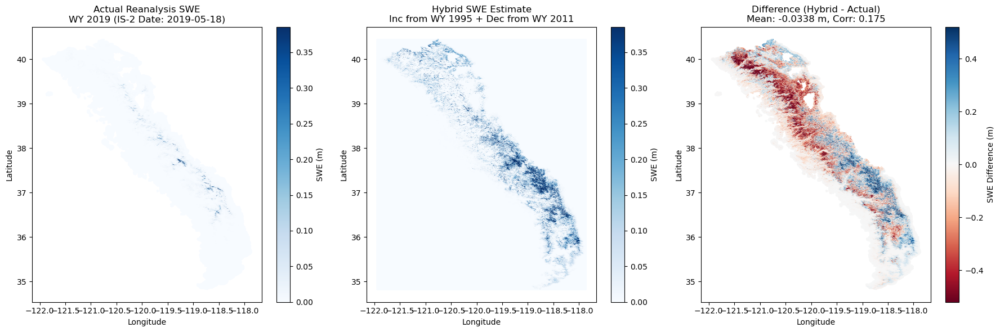

Creating plots:  56%|█████▌    | 5/9 [01:14<01:06, 16.61s/it]

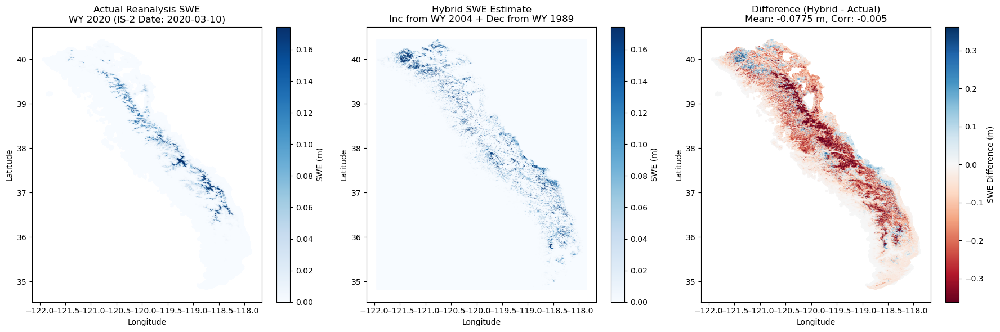

Creating plots:  67%|██████▋   | 6/9 [01:51<01:06, 22.31s/it]

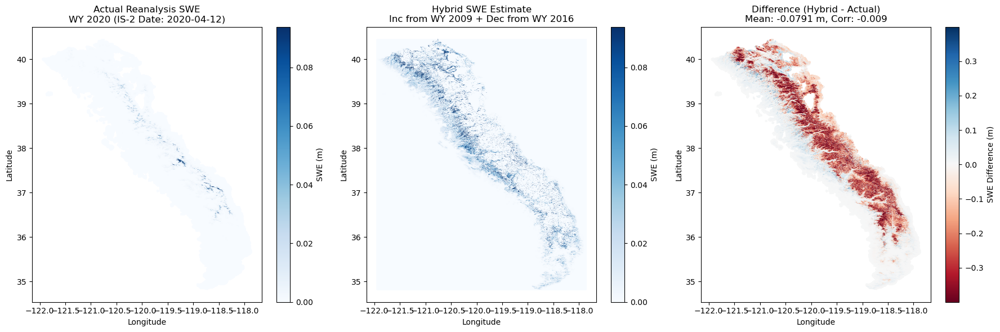

Creating plots:  78%|███████▊  | 7/9 [02:28<00:52, 26.45s/it]

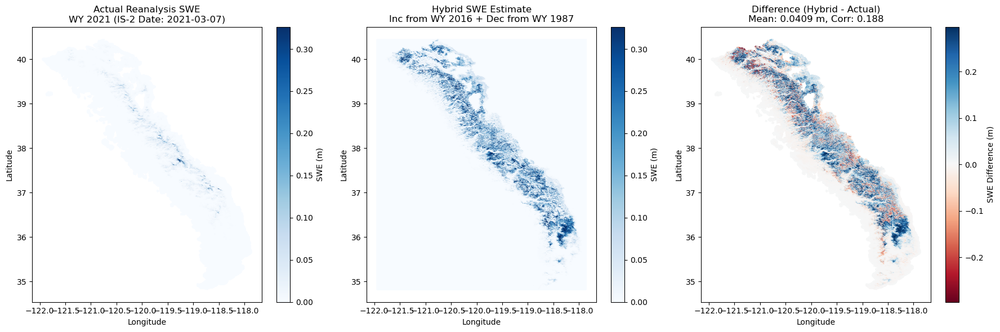

Creating plots:  89%|████████▉ | 8/9 [03:06<00:29, 29.70s/it]

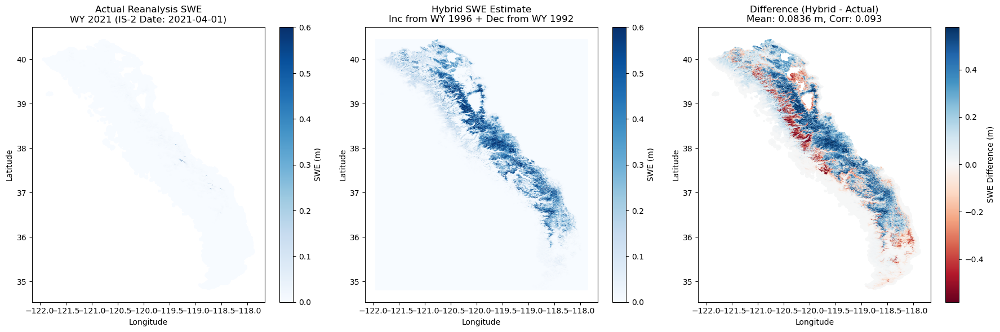

Creating plots: 100%|██████████| 9/9 [03:44<00:00, 24.90s/it]


Plots saved to: /Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/figures/hybrid_swe_maps


In [ ]:
# Step 2b: Create plots for all hybrid SWE files (or a sample)
# Process every Nth file to save time
N = 5  # Process every 5th file
sample_files = hybrid_files[::N]
print(f"Creating plots for {len(sample_files)} files (every {N}th)...")

for hybrid_file in tqdm(sample_files, desc="Creating plots"):
    fig_path = hybrid_figs_dir / hybrid_file.name.replace('.nc', '.png')
    if not fig_path.exists():  # Skip if already exists
        plot_hybrid_swe_comparison(hybrid_file, save_fig_path=fig_path)
        plt.close('all')

print(f"\nPlots saved to: {hybrid_figs_dir}")

In [ ]:
# # Load saved Step 3 data and extract median values for a specific ICESat-2 date
# import pickle
# import pandas as pd

# # Load the saved daily medians
# intermediate_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/temp/analog_intermediate')
# with open(intermediate_dir / 'daily_medians_final.pkl', 'rb') as f:
#     daily_medians_by_date = pickle.load(f)

# # Target ICESat-2 date
# target_date = pd.Timestamp('2019-03-17')

# # Check the structure of the saved data
# print(f"Total IS2 dates saved: {len(daily_medians_by_date)}")
# print(f"\nFirst few IS2 dates: {list(daily_medians_by_date.keys())[:5]}")

# # Check if target date exists
# if target_date in daily_medians_by_date:
#     print(f"\nTarget date {target_date.strftime('%Y-%m-%d')} found!")
#     print(f"Water years available for this date: {list(daily_medians_by_date[target_date].keys())}")
# else:
#     # Try finding a similar date (in case of timestamp format differences)
#     print(f"\nTarget date {target_date} not found directly. Checking for matching dates...")
#     for d in daily_medians_by_date.keys():
#         if str(d).startswith('2019-03-17'):
#             print(f"Found matching date: {d}")
#             target_date = d
#             break

Total IS2 dates saved: 100

First few IS2 dates: [Timestamp('2018-12-03 00:00:00'), Timestamp('2018-12-07 00:00:00'), Timestamp('2018-12-11 00:00:00'), Timestamp('2018-12-12 00:00:00'), Timestamp('2018-12-15 00:00:00')]

Target date 2019-03-17 found!
Water years available for this date: [1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2020, 2021]


In [ ]:
# # Check the is2_date_analog_sd structure - this likely has single-day median values
# with open(intermediate_dir / 'is2_date_analog_sd_final.pkl', 'rb') as f:
#     is2_date_analog_sd = pickle.load(f)

# # Check structure
# print(f"Total IS2 dates in is2_date_analog_sd: {len(is2_date_analog_sd)}")
# print(f"\nFirst few dates: {list(is2_date_analog_sd.keys())[:5]}")

# # Check if target date exists
# if target_date in is2_date_analog_sd:
#     print(f"\nTarget date {target_date.strftime('%Y-%m-%d')} found!")
#     print(f"\nStructure for target date:")
#     target_analog_data = is2_date_analog_sd[target_date]
#     print(f"  Type: {type(target_analog_data)}")
#     if isinstance(target_analog_data, dict):
#         print(f"  Keys: {list(target_analog_data.keys())[:5]}")
#         sample_key = list(target_analog_data.keys())[0]
#         print(f"\n  Sample value for key {sample_key}:")
#         print(f"    Type: {type(target_analog_data[sample_key])}")
#         print(f"    Value: {target_analog_data[sample_key]}")

Total IS2 dates in is2_date_analog_sd: 100

First few dates: [Timestamp('2018-12-03 00:00:00'), Timestamp('2018-12-07 00:00:00'), Timestamp('2018-12-11 00:00:00'), Timestamp('2018-12-12 00:00:00'), Timestamp('2018-12-15 00:00:00')]

Target date 2019-03-17 found!

Structure for target date:
  Type: <class 'pandas.core.frame.DataFrame'>


In [ ]:
# # Examine the DataFrame for the target date
# target_analog_df = is2_date_analog_sd[target_date]
# print(f"Shape: {target_analog_df.shape}")
# print(f"\nColumns: {target_analog_df.columns.tolist()}")
# print(f"\nIndex: {target_analog_df.index.tolist()}")
# target_analog_df

Shape: (36, 2)

Columns: ['water_year', 'mean_sd']

Index: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]


,water_year,mean_sd
0,1985,0.691020
1,1986,1.719960
2,1987,0.630787
3,1988,0.401953
4,1989,0.999627
5,1990,1.012220
6,1991,1.261833
7,1992,1.065060
8,1993,2.516800
9,1994,0.691733


In [ ]:
# # Create DataFrame with water_year as index for the target ICESat-2 date (2019-03-17)
# # This gives the median SD value on that day for each historical year (1985-2021 excluding 2019)

# df_sd_by_year = target_analog_df.copy()
# df_sd_by_year = df_sd_by_year.set_index('water_year')
# df_sd_by_year.columns = ['median_sd']  # Rename to be clearer
# df_sd_by_year.index.name = 'water_year'

# print(f"Median SD values for ICESat-2 date {target_date.strftime('%Y-%m-%d')} across historical years:")
# print(f"Years: {df_sd_by_year.index.tolist()}")
# print(f"\nNote: Water year 2019 is excluded (that's the year of the ICESat-2 observation)")
# df_sd_by_year

Median SD values for ICESat-2 date 2019-03-17 across historical years:
Years: [1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2020, 2021]

Note: Water year 2019 is excluded (that's the year of the ICESat-2 observation)


,median_sd
water_year,
1985,0.691020
1986,1.719960
1987,0.630787
1988,0.401953
1989,0.999627
1990,1.012220
1991,1.261833
1992,1.065060
1993,2.516800


In [ ]:
# Target ICESat-2 date
target_date = pd.Timestamp('2019-03-17')

# Check the raw_sampled_values structure - this has the actual sampled SD values at IS2 coords
with open(intermediate_dir / 'raw_sampled_values_final.pkl', 'rb') as f:
    raw_sampled_values = pickle.load(f)

print(f"Total IS2 dates in raw_sampled_values: {len(raw_sampled_values)}")
print(f"\nFirst few dates: {list(raw_sampled_values.keys())[:5]}")

# Check structure for target date
if target_date in raw_sampled_values:
    print(f"\nTarget date {target_date.strftime('%Y-%m-%d')} found!")
    target_raw = raw_sampled_values[target_date]
    print(f"\nStructure: {type(target_raw)}")
    if isinstance(target_raw, dict):
        print(f"Keys (water years): {list(target_raw.keys())[:5]}")
        sample_wy = list(target_raw.keys())[0]
        print(f"\nSample for WY {sample_wy}:")
        print(f"  Type: {type(target_raw[sample_wy])}")
        if isinstance(target_raw[sample_wy], dict):
            print(f"  Keys: {list(target_raw[sample_wy].keys())}")

Total IS2 dates in raw_sampled_values: 100

First few dates: [Timestamp('2018-12-03 00:00:00'), Timestamp('2018-12-07 00:00:00'), Timestamp('2018-12-11 00:00:00'), Timestamp('2018-12-12 00:00:00'), Timestamp('2018-12-15 00:00:00')]

Target date 2019-03-17 found!

Structure: <class 'dict'>
Keys (water years): [1985, 1986, 1987, 1988, 1989]

Sample for WY 1985:
  Type: <class 'dict'>
  Keys: [69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]


In [ ]:
# Calculate the day-of-water-year for 2019-03-17
# Water year starts Oct 1, so Oct 1 = day 1
def get_wy_day(date):
    """Get day of water year (Oct 1 = day 1)"""
    date = pd.Timestamp(date)
    wy_start = pd.Timestamp(f"{date.year if date.month >= 10 else date.year - 1}-10-01")
    return (date - wy_start).days + 1

target_wy_day = get_wy_day(target_date)
print(f"Target date {target_date.strftime('%Y-%m-%d')} is day {target_wy_day} of water year 2019")

# Check if this day exists in the raw data
sample_wy = 1985
print(f"\nDays available for WY {sample_wy}: {list(target_raw[sample_wy].keys())}")
print(f"Target day {target_wy_day} in available days: {target_wy_day in target_raw[sample_wy]}")

# Get the raw sampled values for the exact target day across all years
if target_wy_day in target_raw[sample_wy]:
    print(f"\nRaw values for day {target_wy_day} in WY {sample_wy}:")
    print(f"  Type: {type(target_raw[sample_wy][target_wy_day])}")
    print(f"  Length: {len(target_raw[sample_wy][target_wy_day])}")
    print(f"  First 5 values: {target_raw[sample_wy][target_wy_day][:5]}")

Target date 2019-03-17 is day 168 of water year 2019

Days available for WY 1985: [69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83]
Target day 168 in available days: False


In [ ]:
# Convert target_wy_day to calendar_day (what the raw_sampled_values is now keyed by)
target_wy = 2019
target_calendar_day = wy_day_to_calendar_day(target_wy_day, target_wy)

# Extract the median SD value for calendar day 76 (2019-03-17) across all historical years
target_raw = raw_sampled_values[target_date]

# Create DataFrame with water_year as index and median SD for the specific day
results = []
for wy in sorted(target_raw.keys()):
    # Use the calendar day for this water year (may differ from target_calendar_day for leap years)
    cal_day = wy_day_to_calendar_day(target_wy_day, wy)
    if cal_day in target_raw[wy]:
        day_values = target_raw[wy][cal_day]
        median_sd = np.nanmedian(day_values)
        results.append({'water_year': wy, 'median_sd': median_sd})

df_sd_by_year = pd.DataFrame(results)
df_sd_by_year = df_sd_by_year.set_index('water_year')

print(f"Median SD values for wy_day {target_wy_day} / calendar day ~{target_calendar_day} (corresponding to {target_date.strftime('%Y-%m-%d')}) across historical years:")
print(f"Years: {df_sd_by_year.index.tolist()}")
print(f"\nNote: Water year 2019 is excluded (that's the year of the ICESat-2 observation)")
df_sd_by_year

Median SD values for wy_day 168 / calendar day ~76 (corresponding to 2019-03-17) across historical years:
Years: [1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2020, 2021]

Note: Water year 2019 is excluded (that's the year of the ICESat-2 observation)


,median_sd
water_year,
1985,0.6670
1986,1.9204
1987,0.6484
1988,0.4132
1989,1.0360
1990,1.0684
1991,1.1554
1992,1.0724
1993,2.5270


# Calculate long term statistics:

In [ ]:
is2_test_track_sa = (medians_both.loc[(medians_both['date'] == '2019-03-17'),'icesat2_3dep_dif'] - np.nanmean(df_sd_by_year['median_sd'])) / np.nanstd(df_sd_by_year['median_sd'])

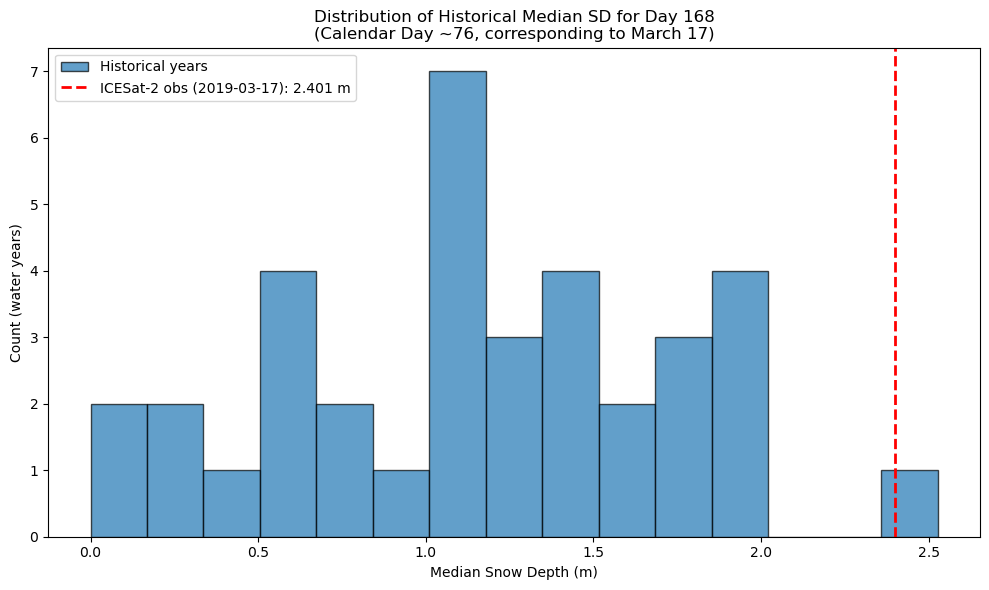


ICESat-2 observed median SD: 2.401 m
Historical mean: 1.152 m
Historical std: 0.592 m
Standardized anomaly: 2.11


In [ ]:
# Plot histogram of historical median SD values with ICESat-2 observed value
fig, ax = plt.subplots(figsize=(10, 6))

# Histogram of historical median SD values
ax.hist(df_sd_by_year['median_sd'].dropna(), bins=15, edgecolor='black', alpha=0.7, label='Historical years')

# Get the ICESat-2 observed value for 2019-03-17
is2_value = medians_both.loc[medians_both['date'] == '2019-03-17', 'icesat2_3dep_dif'].values[0]

# Add vertical dashed line for ICESat-2 observation
ax.axvline(is2_value, color='red', linestyle='--', linewidth=2, label=f'ICESat-2 obs (2019-03-17): {is2_value:.3f} m')

# Add labels and legend
ax.set_xlabel('Median Snow Depth (m)')
ax.set_ylabel('Count (water years)')
ax.set_title(f'Distribution of Historical Median SD for Day {target_wy_day}\n(Calendar Day ~{target_calendar_day}, corresponding to March 17)')
ax.legend()

plt.tight_layout()
plt.show()

print(f"\nICESat-2 observed median SD: {is2_value:.3f} m")
print(f"Historical mean: {df_sd_by_year['median_sd'].mean():.3f} m")
print(f"Historical std: {df_sd_by_year['median_sd'].std():.3f} m")
print(f"Standardized anomaly: {(is2_value - df_sd_by_year['median_sd'].mean()) / df_sd_by_year['median_sd'].std():.2f}")

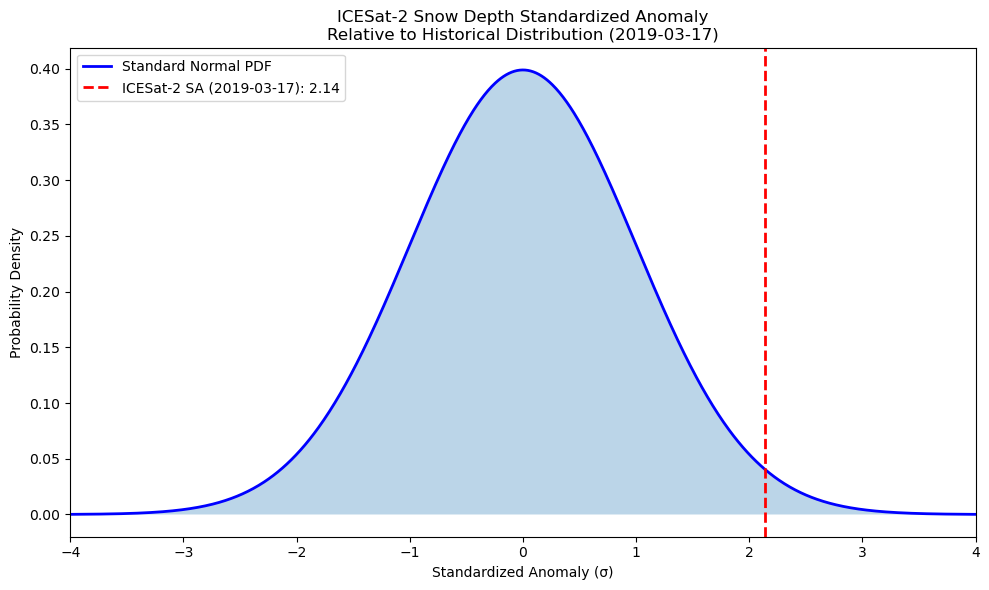


ICESat-2 standardized anomaly: 2.14 σ
This means the 2019-03-17 snow depth was 2.14 standard deviations above the historical mean
Probability of observing a value this extreme or more: 0.032 (two-tailed)


In [ ]:
# Plot the probability distribution function (normal) with the ICESat-2 standardized anomaly
from scipy import stats

fig, ax = plt.subplots(figsize=(10, 6))

# Create x-axis range for the standard normal distribution
x = np.linspace(-4, 4, 1000)

# Plot the standard normal PDF
pdf = stats.norm.pdf(x, loc=0, scale=1)
ax.plot(x, pdf, 'b-', linewidth=2, label='Standard Normal PDF')
ax.fill_between(x, pdf, alpha=0.3)

# Get the standardized anomaly value (scalar)
sa_value = np.nanmedian(is2_test_track_sa.values)

# Add vertical dashed line for ICESat-2 standardized anomaly
ax.axvline(sa_value, color='red', linestyle='--', linewidth=2, 
           label=f'ICESat-2 SA (2019-03-17): {sa_value:.2f}')

# Shade the area beyond the observed value to show how extreme it is
# if sa_value > 0:
#     x_shade = x[x >= sa_value]
#     ax.fill_between(x_shade, stats.norm.pdf(x_shade), alpha=0.5, color='red', 
#                     label=f'P(X ≥ {sa_value:.2f}) = {1 - stats.norm.cdf(sa_value):.3f}')
# else:
#     x_shade = x[x <= sa_value]
#     ax.fill_between(x_shade, stats.norm.pdf(x_shade), alpha=0.5, color='red',
#                     label=f'P(X ≤ {sa_value:.2f}) = {stats.norm.cdf(sa_value):.3f}')

# Add labels and legend
ax.set_xlabel('Standardized Anomaly (σ)')
ax.set_ylabel('Probability Density')
ax.set_title('ICESat-2 Snow Depth Standardized Anomaly\nRelative to Historical Distribution (2019-03-17)')
ax.legend()
ax.set_xlim(-4, 4)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nICESat-2 standardized anomaly: {sa_value:.2f} σ")
print(f"This means the 2019-03-17 snow depth was {abs(sa_value):.2f} standard deviations {'above' if sa_value > 0 else 'below'} the historical mean")
print(f"Probability of observing a value this extreme or more: {2 * (1 - stats.norm.cdf(abs(sa_value))):.3f} (two-tailed)")

In [ ]:
is2_test_track_sa.values

array([2.14008355])

In [ ]:
sd_ds_allyrs

<xarray.Dataset> Size: 96GB
Dimensions:      (y: 1575, x: 1125, time: 13514)
Coordinates:
  * y            (y) float32 6kB 34.0 34.01 34.01 34.02 ... 40.99 40.99 41.0
  * x            (x) float32 4kB -122.0 -122.0 -122.0 ... -117.0 -117.0 -117.0
  * time         (time) datetime64[ns] 108kB 1984-10-01 ... 2021-09-30
    spatial_ref  int64 8B 0
Data variables:
    SD_Post      (y, x, time) float32 96GB dask.array<chunksize=(263, 188, 61), meta=np.ndarray>

In [ ]:
# Select only the date of interest in the snow depth data

# 1. Select March 17 of each year
sd_allyrs_march17 = swe_sca_ds_allyrs_sierras.SD_Post.sel(time=( (swe_sca_ds_allyrs_sierras['time'].dt.month == 3) & (swe_sca_ds_allyrs_sierras['time'].dt.day == 17) ))

# 2. Exclude 2019 from the calculations (that's the observation year)
sd_allyrs_march17_no2019 = sd_allyrs_march17.sel(time=sd_allyrs_march17['time'].dt.year != 2019)

# 3. Compute mean March 17 snow depth across years (excluding 2019)
sd_allyrs_march17_mean = sd_allyrs_march17_no2019.where(sd_allyrs_march17_no2019.mean(dim='time') > 0.1).mean(dim='time', skipna=True).compute()

# 4. Compute standard deviation March 17 across years (excluding 2019)
sd_allyrs_march17_std = sd_allyrs_march17_no2019.where(sd_allyrs_march17_no2019.mean(dim='time') > 0.1).std(dim='time', skipna=True).compute()

print(f"Years included in mean/std calculation: {sd_allyrs_march17_no2019['time'].dt.year.values}")

Years included in mean/std calculation: [1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998
 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012
 2013 2014 2015 2016 2017 2018 2020 2021]


In [ ]:
sd_allyrs_march17_mean

<xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 5MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(1267, 919), dtype=float32)
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    spatial_ref  int64 8B 0

In [ ]:
# Convert standardized anomaly back to snow depth: x = SA * std + mean

sa_sd_test_track = (is2_test_track_sa.values * sd_allyrs_march17_std) + sd_allyrs_march17_mean

In [ ]:
sa_sd_test_track

<xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 9MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(1267, 919))
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    spatial_ref  int64 8B 0

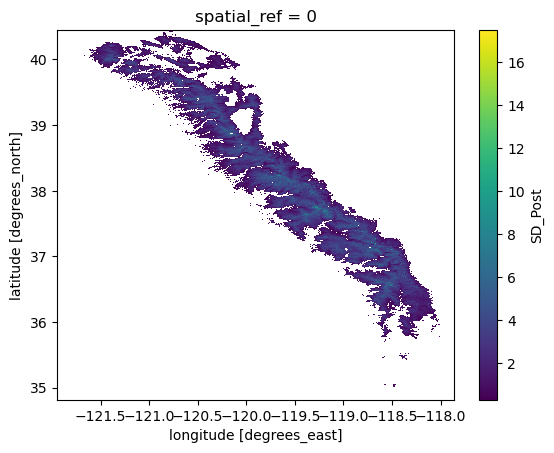

In [ ]:
sa_sd_test_track.plot()

In [ ]:
sa_sd_test_track_dif = (sa_sd_test_track - sd_ds_allyrs.SD_Post.sel(time='2019-03-17')).compute()

In [ ]:

sa_sd_test_track_dif

<xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 9MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(1267, 919))
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2019-03-17

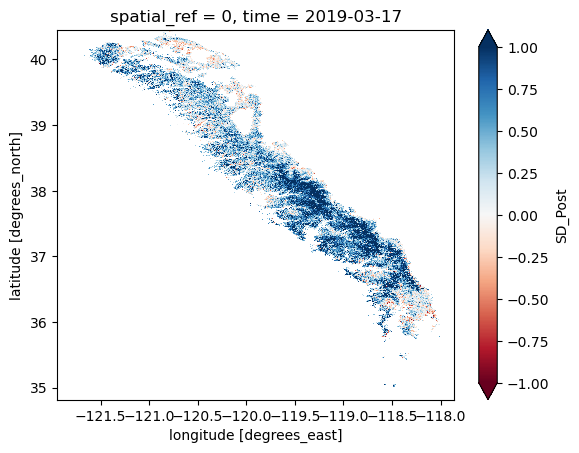

In [ ]:
sa_sd_test_track_dif.plot(vmin=-1,vmax=1,cmap='RdBu')

In [ ]:
sa_sd_test_track_dif_densified = sa_sd_test_track_dif * 0.35

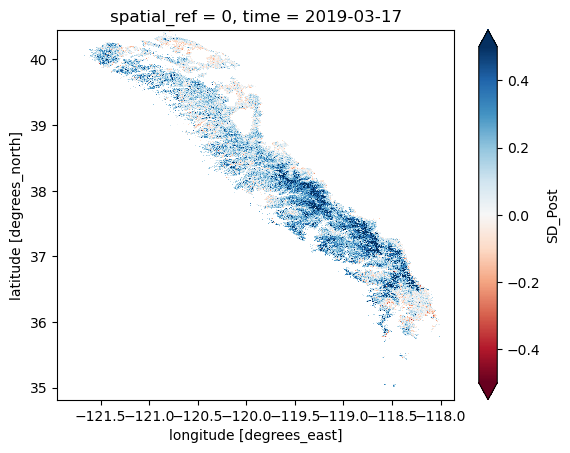

In [ ]:
sa_sd_test_track_dif_densified.plot(vmin=-0.5, vmax=0.5, cmap='RdBu')

In [ ]:
sa_sd_test_track_dif_densified

<xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 9MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(1267, 919))
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2019-03-17

In [ ]:
(sa_sd_test_track_dif_densified.mean() / swe_sca_ds_allyrs_sierras.SWE_Post.sel(time='2019-03-17').mean()).compute() 

<xarray.DataArray ()> Size: 8B
array(0.43966793)
Coordinates:
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2019-03-17

In [ ]:
sa_sd_test_track_densified = sa_sd_test_track * 0.35

In [ ]:
sa_sd_test_track_densified.mean()

<xarray.DataArray 'SD_Post' ()> Size: 8B
array(0.8009597)
Coordinates:
    spatial_ref  int64 8B 0

In [ ]:
swe_sca_ds_allyrs_sierras.SWE_Post.sel(time='2019-03-17').mean().compute() 

<xarray.DataArray 'SWE_Post' ()> Size: 4B
array(0.3529706, dtype=float32)
Coordinates:
    time         datetime64[ns] 8B 2019-03-17
    spatial_ref  int64 8B 0

In [ ]:
sa_sd_test_track_dif_densified.sum

<bound method DataArrayAggregations.sum of <xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 9MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(1267, 919))
Coordinates:
  * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
  * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2019-03-17>

In [ ]:
sa_sd_test_track_dif.sum().values

array(69020.90859933)

In [ ]:
# Convert lat/lon grid cell size to meters
# At the latitude of the Sierra Nevada (~37°N)

# Get the center latitude for the conversion
center_lat = float(sa_sd_test_track_dif.y.mean())
print(f"Center latitude: {center_lat:.2f}°")

# Grid resolution in degrees
dx_deg = abs(float(sa_sd_test_track_dif.x[1] - sa_sd_test_track_dif.x[0]))
dy_deg = abs(float(sa_sd_test_track_dif.y[1] - sa_sd_test_track_dif.y[0]))
print(f"Grid resolution: dx = {dx_deg}°, dy = {dy_deg}°")

# Convert degrees to meters
# 1 degree latitude ≈ 111,320 meters (roughly constant)
# 1 degree longitude ≈ 111,320 * cos(latitude) meters
meters_per_deg_lat = 111320  # m/degree
meters_per_deg_lon = 111320 * np.cos(np.radians(center_lat))  # m/degree

dx_m = dx_deg * meters_per_deg_lon
dy_m = dy_deg * meters_per_deg_lat
print(f"Grid resolution in meters: dx = {dx_m:.1f} m, dy = {dy_m:.1f} m")

# Cell area in m²
cell_area_m2 = dx_m * dy_m
print(f"Cell area: {cell_area_m2:.1f} m² ({cell_area_m2 / 1e6:.4f} km²)")

# Total volume = sum of snow depth (m) * cell area (m²) = m³
total_volume_m3 = sa_sd_test_track_dif.sum(skipna=True).values * cell_area_m2
print(f"\nTotal volume: {total_volume_m3:.2e} m³")
print(f"Total volume: {total_volume_m3 / 1e9:.3f} km³")

# Convert to acre-feet (common unit for water resources in the western US)
# 1 acre-foot = 1233.48 m³
total_volume_af = total_volume_m3 / 1233.48
print(f"Total volume: {total_volume_af:.2e} acre-feet")
print(f"Total volume: {total_volume_af / 1e6:.3f} million acre-feet (MAF)")

Center latitude: 37.63°
Grid resolution: dx = 0.00444793701171875°, dy = 0.004444122314453125°
Grid resolution in meters: dx = 392.1 m, dy = 494.7 m
Cell area: 193990.3 m² (0.1940 km²)

Total volume: 1.34e+10 m³
Total volume: 13.389 km³
Total volume: 1.09e+07 acre-feet
Total volume: 10.855 million acre-feet (MAF)


In [ ]:
target_date

Timestamp('2019-03-17 00:00:00')

In [ ]:
# Examine the raw sampled values for day 168 across a few years
target_raw = raw_sampled_values[target_date]

print(f"Raw sampled SD values for day {target_wy_day} (2019-03-17 equivalent):\n")

# Look at a few years
for wy in [1985, 1995, 2005, 2017, 2021]:
    if wy in target_raw and target_wy_day in target_raw[wy]:
        values = target_raw[wy][target_wy_day]
        print(f"WY {wy}:")
        print(f"  Total points: {len(values)}")
        print(f"  Non-zero points: {np.sum(values > 0)}")
        print(f"  Min: {np.nanmin(values):.3f}, Max: {np.nanmax(values):.3f}")
        print(f"  Mean: {np.nanmean(values):.3f}, Median: {np.nanmedian(values):.3f}")
        print(f"  25th percentile: {np.nanpercentile(values, 25):.3f}")
        print(f"  75th percentile: {np.nanpercentile(values, 75):.3f}")
        print()

Raw sampled SD values for day 168 (2019-03-17 equivalent):



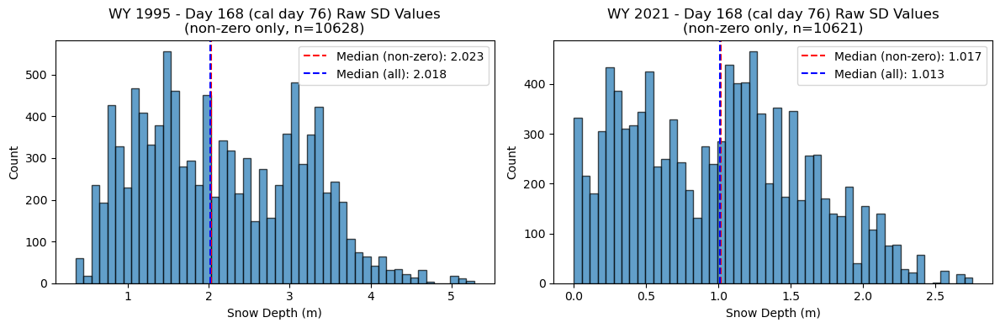

In [ ]:
# Plot histogram of raw values for a high-snow year (1995) vs low-snow year (2021)
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

for ax, wy in zip(axes, [1995, 2021]):
    # Convert wy_day to calendar_day for this water year
    cal_day = wy_day_to_calendar_day(target_wy_day, wy)
    values = target_raw[wy][cal_day]
    # Filter to non-zero values for better visualization
    nonzero = values[values > 0]
    ax.hist(nonzero, bins=50, edgecolor='black', alpha=0.7)
    ax.axvline(np.median(nonzero), color='red', linestyle='--', label=f'Median (non-zero): {np.median(nonzero):.3f}')
    ax.axvline(np.median(values), color='blue', linestyle='--', label=f'Median (all): {np.median(values):.3f}')
    ax.set_xlabel('Snow Depth (m)')
    ax.set_ylabel('Count')
    ax.set_title(f'WY {wy} - Day {target_wy_day} (cal day {cal_day}) Raw SD Values\n(non-zero only, n={len(nonzero)})')
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Compare with full reanalysis domain for WY 1995 on the same day
# Load a daily SD file for that water year and day
daily_sd_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/daily_SD_files')

# Get the date corresponding to WY 1995, day 168
wy_start_1995 = pd.Timestamp('1994-10-01')
date_1995 = wy_start_1995 + pd.Timedelta(days=target_wy_day - 1)
print(f"Date in WY 1995 corresponding to day {target_wy_day}: {date_1995.strftime('%Y-%m-%d')}")

# Load the reanalysis file
sd_file = daily_sd_dir / f'{1995}' / f'day_{target_wy_day:03d}.nc'
if sd_file.exists():
    ds = xr.open_dataset(sd_file)
    sd_full = ds['SD_Post'].values.flatten()
    sd_full = sd_full[~np.isnan(sd_full)]
    
    print(f"\nFull reanalysis domain for WY 1995, day {target_wy_day}:")
    print(f"  Total grid cells: {len(sd_full)}")
    print(f"  Non-zero cells: {np.sum(sd_full > 0)}")
    print(f"  Min: {np.min(sd_full):.3f}, Max: {np.max(sd_full):.3f}")
    print(f"  Mean: {np.mean(sd_full):.3f}, Median: {np.median(sd_full):.3f}")
    ds.close()
else:
    print(f"File not found: {sd_file}")

Date in WY 1995 corresponding to day 168: 1995-03-17

Full reanalysis domain for WY 1995, day 168:
  Total grid cells: 322124
  Non-zero cells: 132817
  Min: 0.000, Max: 10.091
  Mean: 0.413, Median: 0.000


In [ ]:
# Check where high snow depth values exist in reanalysis vs ICESat-2 sampling locations
# For WY 1995, compare the distribution of snow depths

ds = xr.open_dataset(sd_file)
sd_grid = ds['SD_Post'].values

# Get the reanalysis values for locations with SD > 1m
high_snow_mask = sd_grid > 1.0
print(f"Reanalysis WY 1995 day {target_wy_day}:")
print(f"  Grid cells with SD > 1m: {np.sum(high_snow_mask)}")
print(f"  Max SD in reanalysis: {np.nanmax(sd_grid):.3f}m")

# Now compare: what's the percentile distribution?
sd_flat = sd_grid.flatten()
sd_flat = sd_flat[~np.isnan(sd_flat)]
sd_nonzero = sd_flat[sd_flat > 0]

print(f"\nReanalysis (non-zero only):")
print(f"  25th percentile: {np.percentile(sd_nonzero, 25):.3f}m")
print(f"  50th percentile: {np.percentile(sd_nonzero, 50):.3f}m")
print(f"  75th percentile: {np.percentile(sd_nonzero, 75):.3f}m")
print(f"  90th percentile: {np.percentile(sd_nonzero, 90):.3f}m")
print(f"  95th percentile: {np.percentile(sd_nonzero, 95):.3f}m")

# ICESat-2 sampled values - use calendar day
cal_day_1995 = wy_day_to_calendar_day(target_wy_day, 1995)
is2_values = target_raw[1995][cal_day_1995]
is2_nonzero = is2_values[is2_values > 0]
print(f"\nICESat-2 sampled (non-zero only, calendar day {cal_day_1995}):")
print(f"  25th percentile: {np.percentile(is2_nonzero, 25):.3f}m")
print(f"  50th percentile: {np.percentile(is2_nonzero, 50):.3f}m")
print(f"  75th percentile: {np.percentile(is2_nonzero, 75):.3f}m")
print(f"  90th percentile: {np.percentile(is2_nonzero, 90):.3f}m")

Reanalysis WY 1995 day 168:
  Grid cells with SD > 1m: 39540
  Max SD in reanalysis: 10.618m

Reanalysis (non-zero only):
  25th percentile: 0.062m
  50th percentile: 0.506m
  75th percentile: 1.169m
  90th percentile: 1.665m
  95th percentile: 1.927m

ICESat-2 sampled (non-zero only, calendar day 76):
  25th percentile: 1.330m
  50th percentile: 2.023m
  75th percentile: 3.038m
  90th percentile: 3.447m


In [ ]:
# Check the structure of is2_coords_by_date
is2_coords = is2_coords_by_date[target_date]
print(f"Type: {type(is2_coords)}")
if isinstance(is2_coords, dict):
    print(f"Keys: {list(is2_coords.keys())}")
    sample_key = list(is2_coords.keys())[0]
    print(f"\nSample for key '{sample_key}':")
    print(f"  Type: {type(is2_coords[sample_key])}")
    if hasattr(is2_coords[sample_key], 'shape'):
        print(f"  Shape: {is2_coords[sample_key].shape}")

Type: <class 'dict'>
Keys: ['x', 'y']

Sample for key 'x':
  Type: <class 'numpy.ndarray'>
  Shape: (10706,)


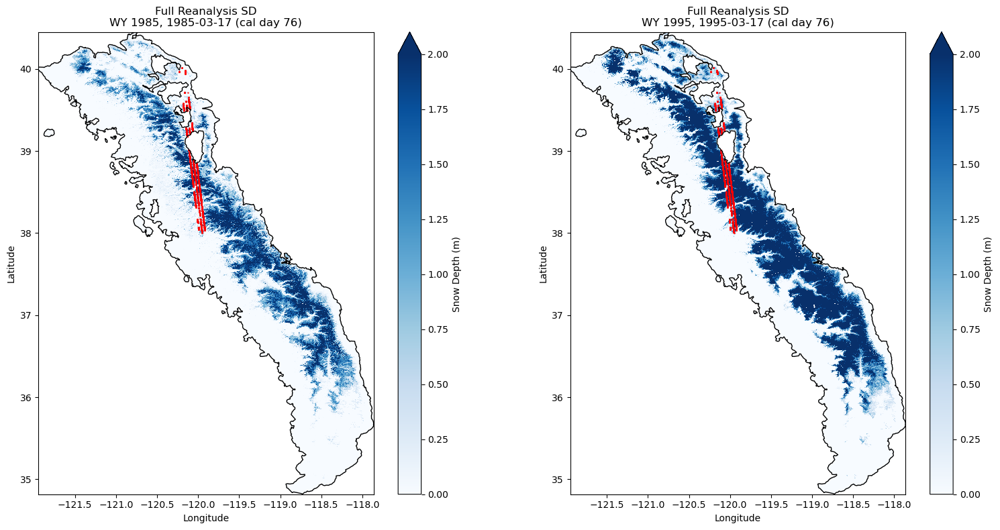

In [ ]:
# Plot full gridded reanalysis for 1985 and 1995 on day 168
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

daily_sd_dir = Path('/Users/hannah/Documents/Grad_Documents/Research/analog_snowmapping/data/reanalysis/daily_SD_files')

for ax, wy in zip(axes, [1985, 1995]):
    # Convert wy_day to calendar_day for file lookup
    cal_day = wy_day_to_calendar_day(target_wy_day, wy)
    sd_file = daily_sd_dir / f'{wy}' / f'day_{cal_day:03d}.nc'
    ds = xr.open_dataset(sd_file)
    
    # Plot the gridded data
    ds['SD_Post'].plot(ax=ax, cmap='Blues', vmin=0, vmax=2, 
                        cbar_kwargs={'label': 'Snow Depth (m)'})
    
    # Add Sierra Nevada boundary
    sierras.boundary.plot(ax=ax, color='black', linewidth=1)
    
    # Overlay ICESat-2 track locations (just the points, no color)
    ax.scatter(x_plot, y_plot, c='red', s=0.5, alpha=0.5, label='IS2 track')
    
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Calculate date for this water year
    wy_start = pd.Timestamp(f"{wy-1}-10-01")
    date_wy = wy_start + pd.Timedelta(days=target_wy_day - 1)
    
    ax.set_title(f'Full Reanalysis SD\nWY {wy}, {date_wy.strftime("%Y-%m-%d")} (cal day {cal_day})')
    ax.set_aspect('equal')
    ds.close()

plt.tight_layout()
plt.show()

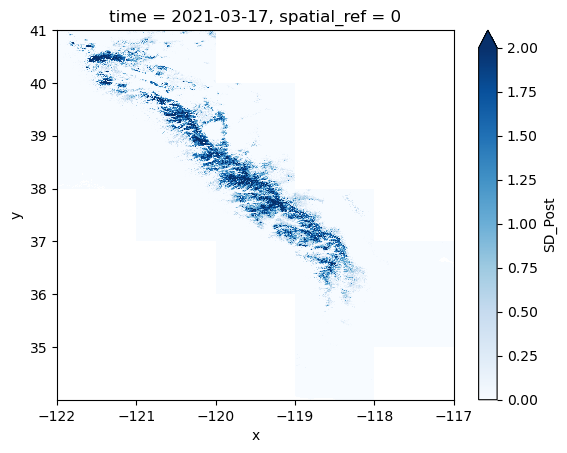

In [ ]:
swe_sca_ds_allyrs.SD_Post.sel(time='2021-03-17').plot(vmin=0, vmax=2, cmap='Blues')

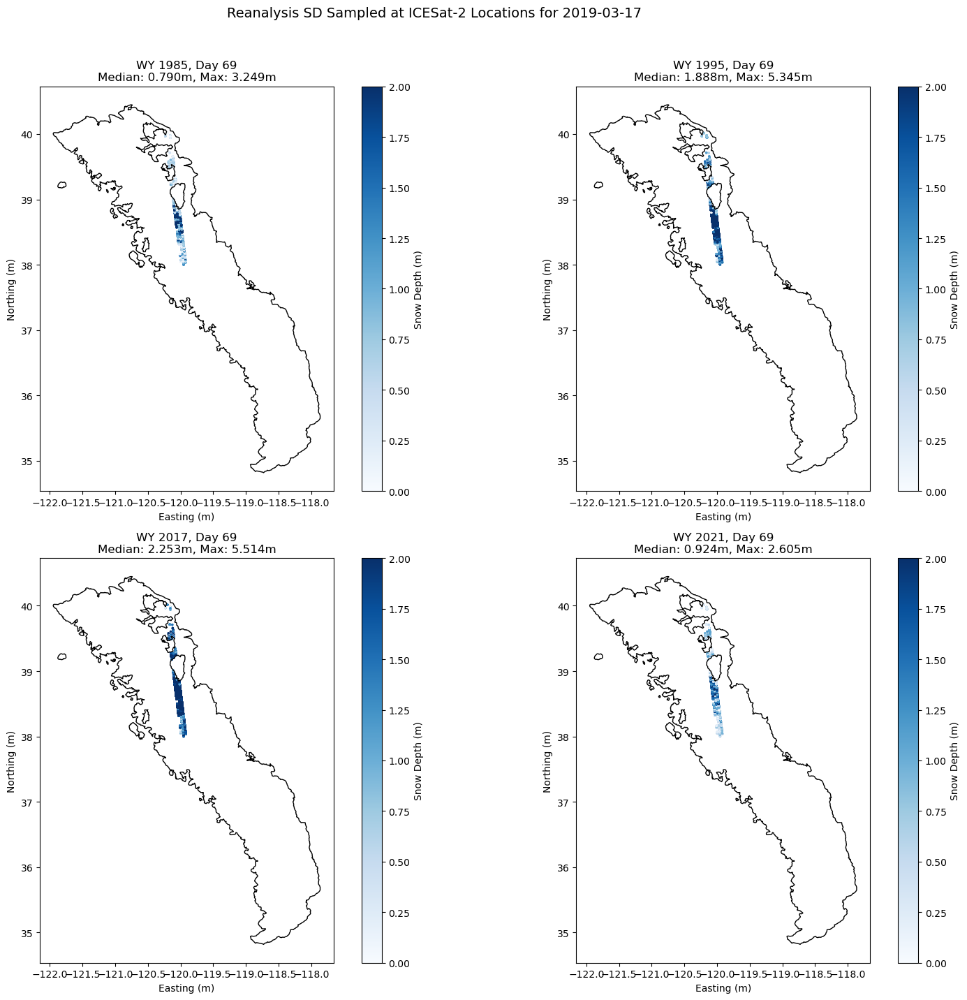


Summary for 2019-03-17:
  WY 1985: Median=0.790m, Mean=0.985m, Max=3.249m
  WY 1995: Median=1.888m, Mean=2.039m, Max=5.345m
  WY 2017: Median=2.253m, Mean=2.456m, Max=5.514m
  WY 2021: Median=0.924m, Mean=0.895m, Max=2.605m


In [ ]:
# Plot sampled values spatially for 2019-03-17 across different historical years
target_date = pd.Timestamp('2019-03-17')
target_raw = raw_sampled_values[target_date]

# Get ICESat-2 coordinates for this date
is2_coords = is2_coords_by_date[target_date]
x_coords = is2_coords['x']
y_coords = is2_coords['y']

# Plot for WY 1985, 1995, 2017, 2021
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

years_to_plot = [1985, 1995, 2017, 2021]
for ax, wy in zip(axes, years_to_plot):
    # Get the calendar day key (after the fix, raw_sampled_values uses calendar day)
    # Find the key that exists for this water year
    if wy in target_raw:
        day_keys = list(target_raw[wy].keys())
        if len(day_keys) > 0:
            # Use the first available day key (should be around day 76 for March 17)
            day_key = day_keys[0]
            values = target_raw[wy][day_key]
            
            min_len = min(len(x_coords), len(y_coords), len(values))
            x_plot = x_coords[:min_len]
            y_plot = y_coords[:min_len]
            v_plot = values[:min_len]
            
            scatter = ax.scatter(x_plot, y_plot, c=v_plot, cmap='Blues', 
                                 s=2, vmin=0, vmax=2)
            cbar = plt.colorbar(scatter, ax=ax, label='Snow Depth (m)')
            
            sierras.boundary.plot(ax=ax, color='black', linewidth=1)
            
            ax.set_xlabel('Easting (m)')
            ax.set_ylabel('Northing (m)')
            ax.set_title(f'WY {wy}, Day {day_key}\nMedian: {np.nanmedian(values):.3f}m, Max: {np.nanmax(values):.3f}m')
            ax.set_aspect('equal')
        else:
            ax.set_title(f'WY {wy}: No data')
    else:
        ax.set_title(f'WY {wy}: No data')

plt.suptitle(f'Reanalysis SD Sampled at ICESat-2 Locations for {target_date.date()}', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nSummary for {target_date.date()}:")
for wy in years_to_plot:
    if wy in target_raw:
        day_keys = list(target_raw[wy].keys())
        if len(day_keys) > 0:
            values = target_raw[wy][day_keys[0]]
            print(f"  WY {wy}: Median={np.nanmedian(values):.3f}m, Mean={np.nanmean(values):.3f}m, Max={np.nanmax(values):.3f}m")